In [1]:
import tensorflow as tf
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import math
import matplotlib
from scipy import ndimage, misc

In [2]:
def make_batch(input_path, label_path, batch_size = 16):
    num_of_data = len(input_path)
    index = np.arange(0, num_of_data)
    np.random.shuffle(index)
    index = index[:batch_size]
    
    shuffled_input_path = [input_path[i] for i in index]
    #shuffled_anno_data = [anno_data[j] for j in index]
    shuffled_label_path = [[label_path[j:j+1]][0][0] for j in index]
    #shuffled_anno_data = [anno_data[j:j+1][0][0][0] for j in index]
    
    return np.asarray(shuffled_input_path), np.asarray(shuffled_label_path)

def image_normalize(_input):
    batch_size = np.shape(_input)[0]
    height = np.shape(_input)[1]
    width = np.shape(_input)[2]
    channel = np.shape(_input)[3]
    
    _max_map = [[[[255.0] * channel] * width] * height] * batch_size
    
    output = []

    output = (np.divide(_input, _max_map))
        
    return output

In [3]:
class STN(object):
    def __init__(self, sess, batch_size, epochs):
        self.input_size = 356
        self.output_size = 89
        self.batch_size = batch_size
        self.epochs = epochs
        self.sess = sess
        
        self.initial = np.array([[1., 0., 0.], [0., 1., 0.]], dtype=np.float32)
        self.initial = self.initial.flatten()
        
        self.initial = np.expand_dims(self.initial, axis=0)
        
        self.num_of_conditionmap_channel = 1
        self.num_of_input_channel = 1
        self.num_of_output_channel = 1

        self.X = tf.placeholder(dtype=tf.float32, shape=[None, self.input_size, self.input_size, self.num_of_input_channel])
        self.Y = tf.placeholder(dtype=tf.float32, shape=[None, self.output_size, self.output_size, self.num_of_output_channel])
        self.Condition_Vector = tf.placeholder(dtype = tf.float32, shape = [None, self.input_size, self.input_size, self.num_of_conditionmap_channel])
        #self.Output = tf.placeholder(dtype = tf.float32, shape=[None, self.output_size, self.output_size, 1])
        
        self.W1 = tf.Variable(tf.random_normal(shape=[3, 3, self.num_of_conditionmap_channel + self.num_of_input_channel, 32], stddev=0.01))# 4채널 이유 -> condition vector concat
        self.W2 = tf.Variable(tf.random_normal(shape=[3, 3, 32, 64], stddev=0.01))
        self.W3 = tf.Variable(tf.random_normal(shape=[3, 3, 64, 128], stddev=0.01))
        self.W4 = tf.Variable(tf.random_normal(shape=[3, 3, 128, 256], stddev=0.01))
        self.W5 = tf.Variable(tf.random_normal(shape=[3, 3, 256, 512], stddev=0.01))
        self.W6 = tf.Variable(tf.random_normal(shape=[3, 3, 512, 256], stddev=0.01))
        self.W7 = tf.Variable(tf.random_normal(shape=[3, 3, 256, 128], stddev=0.01))
        self.W8 = tf.Variable(tf.random_normal(shape=[3, 3, 128, 64], stddev=0.01))
        self.W9 = tf.Variable(tf.random_normal(shape=[89*89*64, 32], stddev=0.01))
        self.W10 = tf.Variable(tf.zeros(shape=[32, 6]))
        self.b10 = tf.Variable(self.initial)
        
        
        self.model()
        #self.Get_Pixel_Value()
    
    def Localisation_Net(self, img, condition_vector):
        #img -> [batch, 356, 356, 3]
        img = tf.concat([img, condition_vector], 3)
        
        
        net = tf.nn.conv2d(img, self.W1, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        net = tf.nn.max_pool(net, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding="SAME")
        
        #net -> [batch, 178, 178, 32]
        net = tf.nn.conv2d(net, self.W2, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        net = tf.nn.max_pool(net, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding="SAME")
        
        #net -> [batch, 89, 89, 64]
        net = tf.nn.conv2d(net, self.W3, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        
        #net -> [batch, 89, 89, 128]
        net = tf.nn.conv2d(net, self.W4, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        
        #net -> [batch, 89, 89, 256]
        net = tf.nn.conv2d(net, self.W5, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        
        #net -> [batch, 89, 89, 128]
        net = tf.nn.conv2d(net, self.W6, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        
        net = tf.nn.conv2d(net, self.W7, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        
        net = tf.nn.conv2d(net, self.W8, padding="SAME", strides=[1, 1, 1, 1])
        net = tf.nn.relu(net)
        
        #net -> [batch, 89, 89, 64]
        net = tf.reshape(net, [-1, 89*89*64])
        net = tf.matmul(net, self.W9)
        net = tf.nn.relu(net)
        
        #net -> [batch, 32]
        net = tf.matmul(net, self.W10)
        net = tf.add(net, self.b10)
        
        #net -> [batch, 6]
        theta = net
        return theta
    
        
    def Grid_Generator(self, theta):
        theta = tf.reshape(theta, shape=[-1, 2, 3])
        
        width = self.output_size
        height = self.output_size
        
        x = tf.linspace(-1.0, 1.0, width)
        y = tf.linspace(-1.0, 1.0, height)
        x_t, y_t = tf.meshgrid(x, y)

        # flatten
        x_t_flat = tf.reshape(x_t, [-1])
        y_t_flat = tf.reshape(y_t, [-1])

        # reshape to [x_t, y_t , 1] - (homogeneous form)
        ones = tf.ones_like(x_t_flat)
        sampling_grid = tf.stack([x_t_flat, y_t_flat, ones])

        # repeat grid num_batch times
        sampling_grid = tf.expand_dims(sampling_grid, axis=0)
        sampling_grid = tf.tile(sampling_grid, tf.stack([self.batch_size, 1, 1]))

        # cast to float32 (required for matmul)
        theta = tf.cast(theta, 'float32')
        sampling_grid = tf.cast(sampling_grid, 'float32')

        # transform the sampling grid - batch multiply
        batch_grids = tf.matmul(theta, sampling_grid)
        # batch grid has shape (num_batch, 2, H*W)

        # reshape to (num_batch, H, W, 2)
        batch_grids = tf.reshape(batch_grids, [self.batch_size, 2, height, width])

        return batch_grids
    
    def get_pixel_value(self, img, x, y):
        
        shape = tf.shape(x)
        batch_size = shape[0]
        height = shape[1]
        width = shape[2]

        batch_idx = tf.range(0, batch_size)
        batch_idx = tf.reshape(batch_idx, (batch_size, 1, 1))
        b = tf.tile(batch_idx, (1, height, width))

        indices = tf.stack([b, y, x], 3)

        return tf.gather_nd(img, indices)
        
    def Bilinear_Sampler(self, img, grid):
        x = grid[:, 0, :, :]
        y = grid[:, 1, :, :]
        
        H = tf.shape(img)[1]
        W = tf.shape(img)[2]
        max_y = tf.cast(H - 1, 'int32')
        max_x = tf.cast(W - 1, 'int32')
        zero = tf.zeros([], dtype='int32')

        # rescale x and y to [0, W-1/H-1]
        x = tf.cast(x, 'float32')
        y = tf.cast(y, 'float32')
        x = 0.5 * ((x + 1.0) * tf.cast(max_x-1, 'float32'))
        y = 0.5 * ((y + 1.0) * tf.cast(max_y-1, 'float32'))

        # grab 4 nearest corner points for each (x_i, y_i)
        x0 = tf.cast(tf.floor(x), 'int32')
        x1 = x0 + 1
        y0 = tf.cast(tf.floor(y), 'int32')
        y1 = y0 + 1

        # clip to range [0, H-1/W-1] to not violate img boundaries
        x0 = tf.clip_by_value(x0, zero, max_x)
        x1 = tf.clip_by_value(x1, zero, max_x)
        y0 = tf.clip_by_value(y0, zero, max_y)
        y1 = tf.clip_by_value(y1, zero, max_y)

        # get pixel value at corner coords
        Ia = self.get_pixel_value(img, x0, y0)
        Ib = self.get_pixel_value(img, x0, y1)
        Ic = self.get_pixel_value(img, x1, y0)
        Id = self.get_pixel_value(img, x1, y1)

        # recast as float for delta calculation
        x0 = tf.cast(x0, 'float32')
        x1 = tf.cast(x1, 'float32')
        y0 = tf.cast(y0, 'float32')
        y1 = tf.cast(y1, 'float32')

        # calculate deltas
        wa = (x1-x) * (y1-y)
        wb = (x1-x) * (y-y0)
        wc = (x-x0) * (y1-y)
        wd = (x-x0) * (y-y0)

        # add dimension for addition
        wa = tf.expand_dims(wa, axis=3)
        wb = tf.expand_dims(wb, axis=3)
        wc = tf.expand_dims(wc, axis=3)
        wd = tf.expand_dims(wd, axis=3)

        # compute output
        out = tf.add_n([wa*Ia, wb*Ib, wc*Ic, wd*Id])

        return out
        
        
    def load_data(self, rot = False, trans = False):
        all_label_img_list = os.listdir("./dataset/Cropped_Resized_Image_89/")
        all_input_img_list = os.listdir("./dataset/Resized_Image/")
        
        batch_input_img_list, batch_label_img_list = make_batch(all_input_img_list, all_label_img_list, batch_size=self.batch_size)
        
        condition_vector = []
        for i in range(len(batch_input_img_list)):
            if(batch_input_img_list[i][-5] == 'l'):
                tmp = np.ones((356, 356))
                tmp = np.expand_dims(tmp, axis=2)
                condition_vector.append(tmp)
            else:
                tmp = np.zeros((356, 356))
                tmp = np.expand_dims(tmp, axis=2)
                condition_vector.append(tmp)
                
        batch_input_img = []        
        for i in range(len(batch_input_img_list)):
            img = cv2.imread("./dataset/Resized_Image/" + batch_input_img_list[i])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            batch_input_img.append(img)
            
        batch_label_img = []
        for i in range(len(batch_label_img_list)):
            img = cv2.imread("./dataset/Cropped_Resized_Image_89/" + batch_label_img_list[i])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (self.output_size, self.output_size))
            batch_label_img.append(img)
            
        for i in range(len(batch_input_img)):
            batch_input_img[i] = cv2.normalize(batch_input_img[i], None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
            batch_label_img[i] = cv2.normalize(batch_label_img[i], None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
        batch_input_img = np.expand_dims(batch_input_img, axis = 3)
        batch_label_img = np.expand_dims(batch_label_img, axis = 3)
        return batch_input_img, batch_label_img, condition_vector
        
    def spatial_transformer(self, _input, condition_vector):
        self.theta = self.Localisation_Net(_input, condition_vector)
        self.grid = self.Grid_Generator(self.theta)
        output = self.Bilinear_Sampler(_input, self.grid)
        
        return output
    
    
    def model(self):
        self.stn_output = self.spatial_transformer(self.X, self.Condition_Vector)
        self.l2_loss = tf.nn.l2_loss((self.stn_output - self.Y) / self.batch_size)
        self.loss = tf.reduce_mean(self.l2_loss)
        
        global_step = tf.Variable(0, trainable=False)
        starter_learning_rate = 3e-05
        lr = tf.train.exponential_decay(starter_learning_rate, global_step,100000, 0.333, staircase=True)
        self.optimizer = tf.train.AdamOptimizer(learning_rate = lr).minimize(self.loss, global_step = global_step)
        
    def train(self):
        data_size = 18350
        batch_size = self.batch_size
        total_batch = data_size//batch_size

        loss_data = []
        
        SAVE_PATH = "C:/Users/SimJaekyu/Documents/Jupyter Notebook/Hand_STN/Weight/Weight.ckpt"
        print("session start")
        self.sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver()
        try:
            saver.restore(self.sess, SAVE_PATH)
            print("Existing Weight.ckpt file load")
            print("Training Start")
        except:
            print("No Training Weight.ckpt exist")
            print("Make New Weight.ckpt file for training")
            print("Training Start")
        
        loss_data = []
        for epoch in range(self.epochs):#self.epochs):#15
            print("epoch",epoch+1, "start")
            for i in range(total_batch):#total_batch
                #data load, batch 생성
                input_image, label_image, condition_vector = self.load_data()
                
                #print("self.X's shape : ", np.shape(input_image), "self.Y's shape : ", np.shape(label_image), "Condition_Vector's shape : ", np.shape(condition_vector))
                total_loss_opt, net_loss, predict, theta = self.sess.run([self.optimizer, self.l2_loss, self.stn_output, self.theta], feed_dict = {self.X : input_image, self.Y : label_image, self.Condition_Vector : condition_vector})
                loss_data.append(net_loss)
            fig = plt.figure()
            
            print("Theta[0] : ", theta[0])
            
            
            tmp = np.squeeze(input_image[0])
            plt.subplot(131)
            plt.imshow(tmp)
            
            tmp = np.squeeze(predict[0])
            plt.subplot(132)
            plt.imshow(tmp)
            
            tmp = np.squeeze(label_image[0])
            plt.subplot(133)
            plt.imshow(tmp)
            
            fig = matplotlib.pyplot.gcf()
            fig.set_size_inches(12, 4)
            plt.show()
            
            plt.plot(loss_data)
            plt.show()
            print(net_loss)
            saver.save(self.sess, SAVE_PATH)
            
            #return rotate_img, label_img
print("cell end")

cell end


session start
INFO:tensorflow:Restoring parameters from C:/Users/SimJaekyu/Documents/Jupyter Notebook/Hand_STN/Weight/Weight.ckpt
No Training Weight.ckpt exist
Make New Weight.ckpt file for training
Training Start
epoch 1 start
Theta[0] :  [ 0.08126974  0.06086804 -0.18716052  0.0085782   0.34251964  0.54557836]


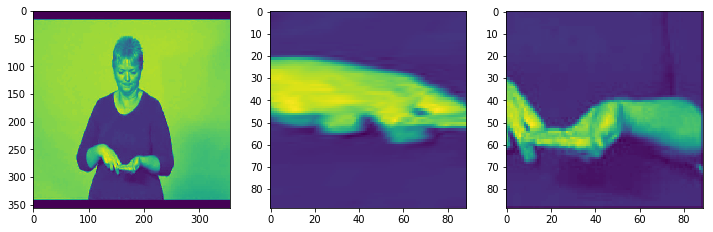

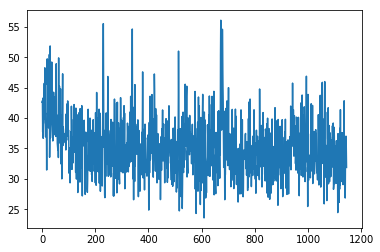

31.8823
epoch 2 start
Theta[0] :  [ 0.44191718  0.03494134  0.14199132 -0.00819929  0.54498315  0.34416303]


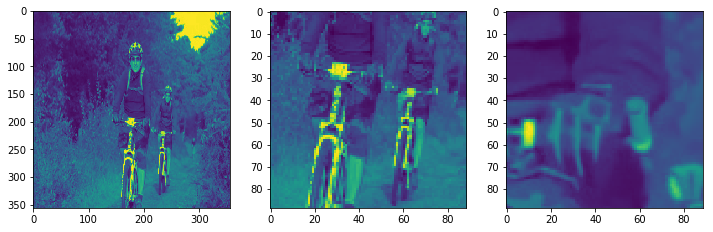

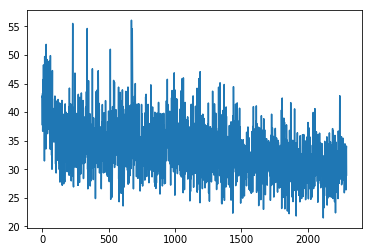

28.9675
epoch 3 start
Theta[0] :  [ 0.64766288 -0.00249725 -0.06251175 -0.00816725  0.72877204  0.20641242]


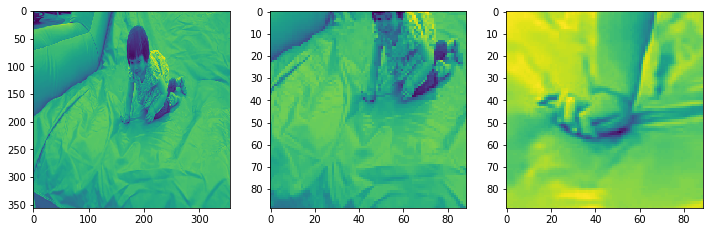

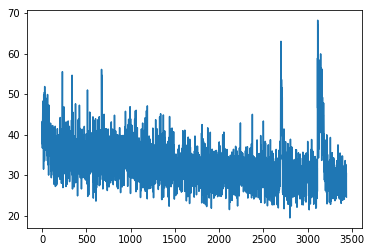

24.5575
epoch 4 start
Theta[0] :  [ 0.64105308  0.04763027 -0.15851893  0.00638634  0.71080518  0.17511606]


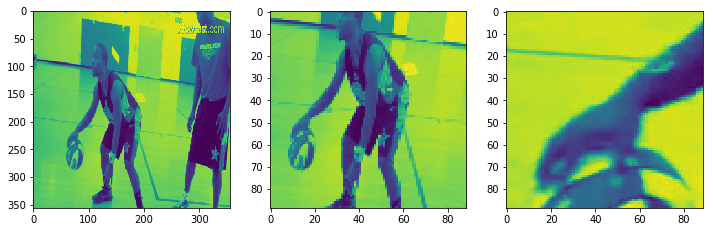

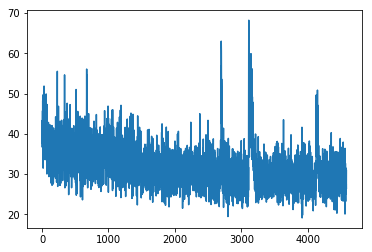

30.8453
epoch 5 start
Theta[0] :  [ 0.4104901  -0.11456492  0.31491756  0.05984332  0.22464043  0.58516127]


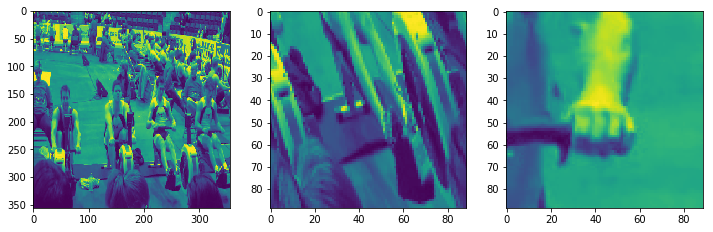

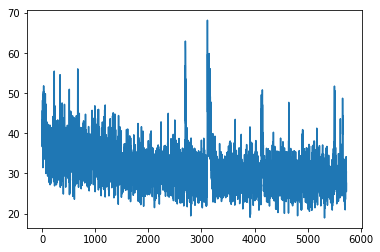

27.5475
epoch 6 start
Theta[0] :  [ 0.76572073  0.04883508 -0.28197554  0.00979741  0.92105436  0.06722873]


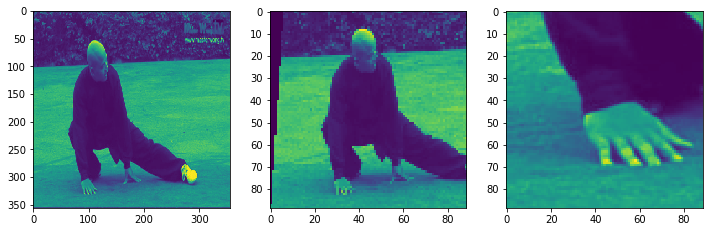

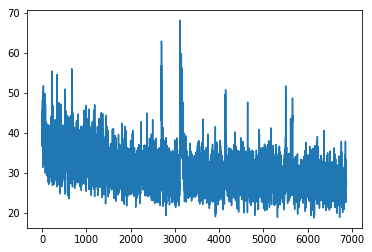

27.4246
epoch 7 start
Theta[0] :  [ 0.16114873  0.02486369  0.08439229 -0.00256888 -0.11006826  0.52747375]


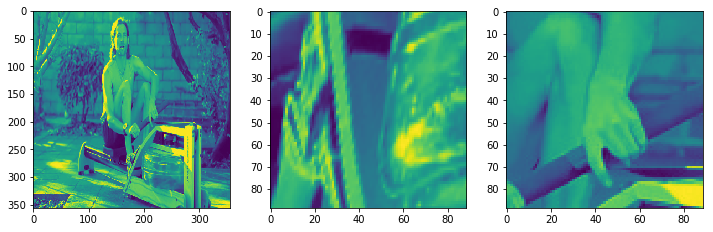

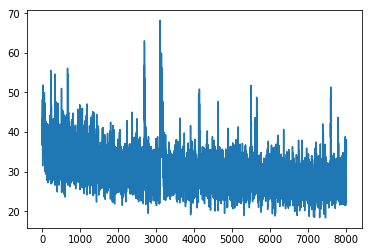

34.436
epoch 8 start
Theta[0] :  [ 0.35861433 -0.08557204  0.30302241 -0.02196165  0.22670096  0.67047983]


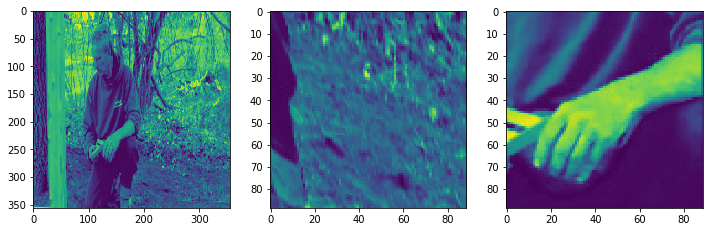

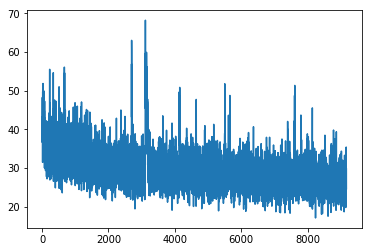

24.6362
epoch 9 start
Theta[0] :  [ 0.3427462   0.11315512 -0.38105875 -0.00803505  0.57705259  0.29027206]


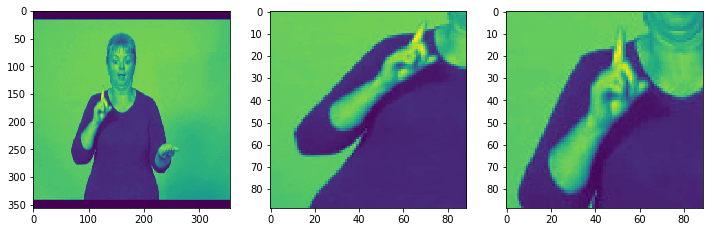

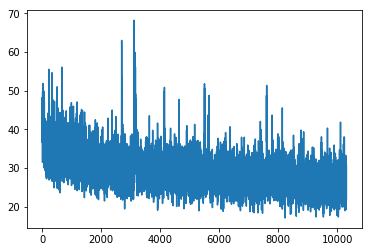

30.707
epoch 10 start
Theta[0] :  [ 0.32648265 -0.04050792  0.10471784  0.05163518  0.24755979  0.3713592 ]


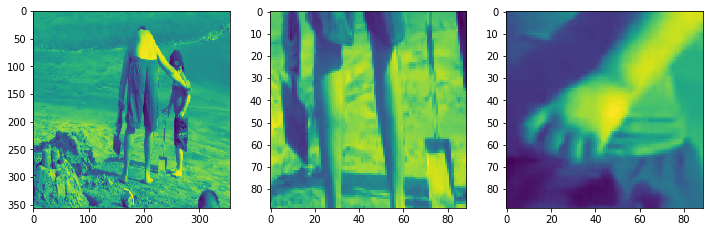

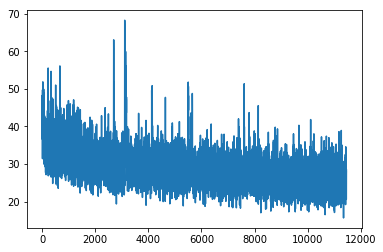

28.4526
epoch 11 start
Theta[0] :  [ 0.28226656  0.06622557  0.03741821  0.01139061  0.23879254  0.325836  ]


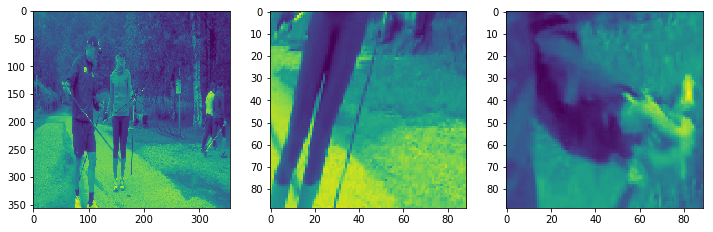

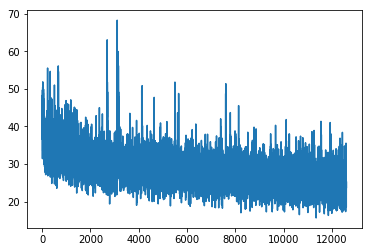

23.8186
epoch 12 start
Theta[0] :  [ 0.4870514   0.28870323 -0.51929879  0.02940333  0.67737496  0.19986866]


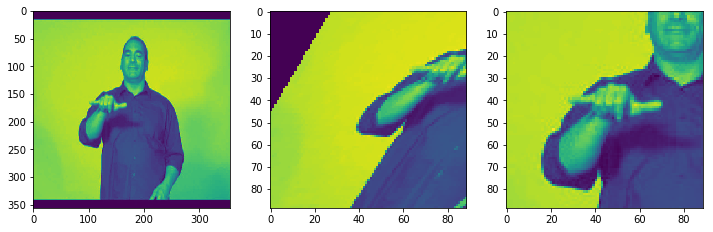

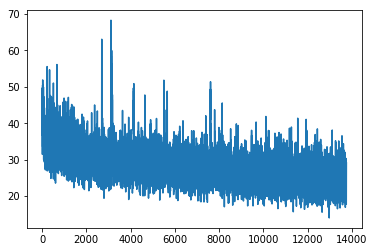

29.1129
epoch 13 start
Theta[0] :  [ 0.398534   -0.19349469  0.42558795 -0.01988086  0.17106736  0.73110151]


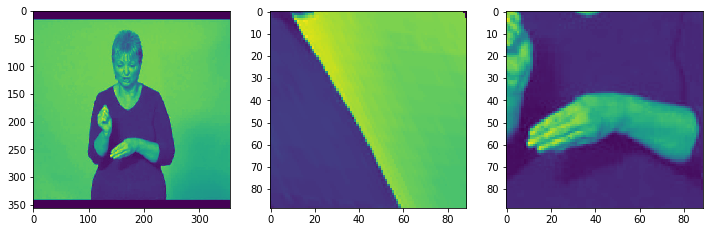

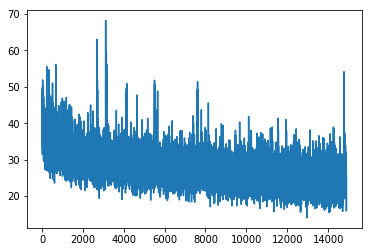

25.463
epoch 14 start
Theta[0] :  [ 0.33770216 -0.10980799  0.15513794  0.00740727  0.39654547  0.60077524]


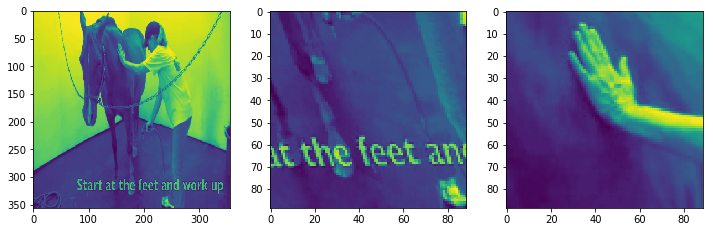

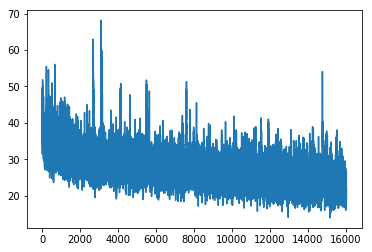

21.5197
epoch 15 start
Theta[0] :  [ 0.32403904  0.02057553 -0.45726496 -0.01928257  0.49335074  0.37283331]


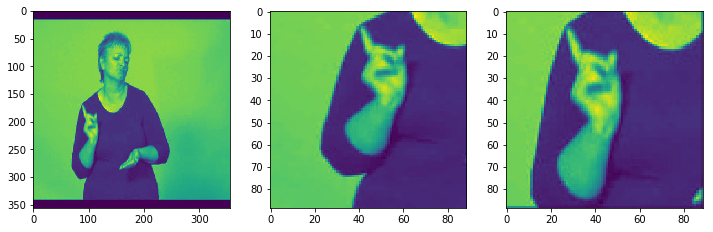

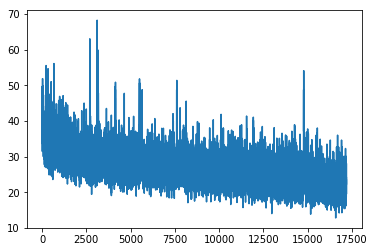

24.0771
epoch 16 start
Theta[0] :  [ 0.28195071  0.1273451  -0.26633781  0.00892335  0.38162988  0.15622747]


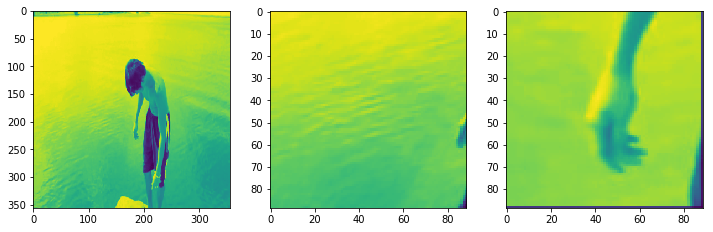

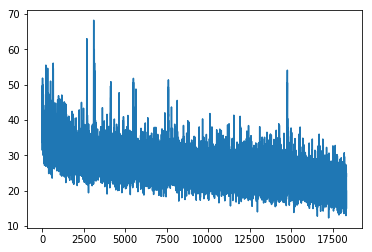

19.9039
epoch 17 start
Theta[0] :  [-0.14072466 -0.0469667   0.20963866 -0.00282486 -0.02745706  0.72996885]


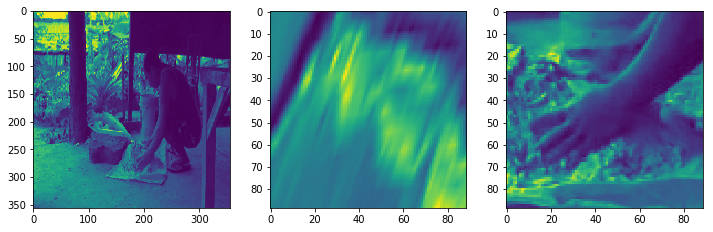

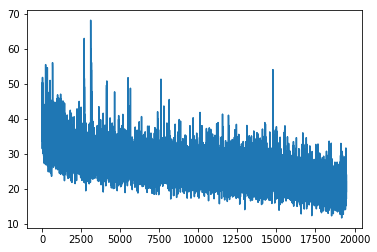

19.2214
epoch 18 start
Theta[0] :  [ 0.18265897 -0.04341245  0.56116909 -0.06152565  0.1540153   0.41157797]


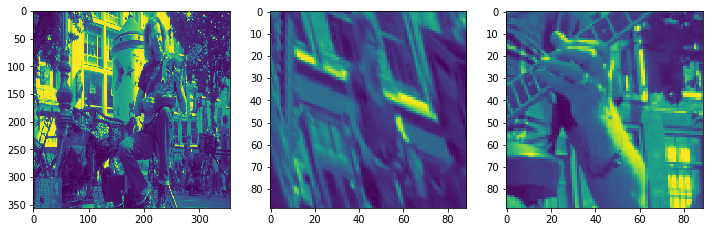

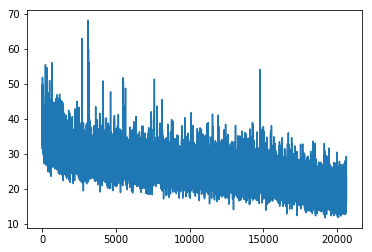

23.6822
epoch 19 start
Theta[0] :  [ 0.58955204 -0.03930731 -0.17778122 -0.11528791  0.34891528  0.0773731 ]


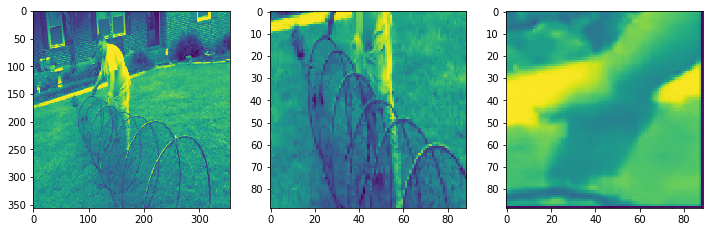

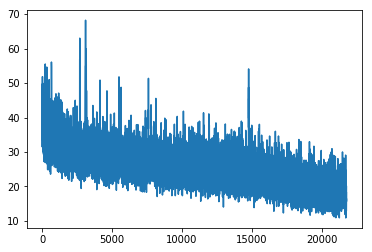

18.1868
epoch 20 start
Theta[0] :  [ 0.11671329 -0.27578443  0.45243332  0.05787984 -0.16067177  0.87391311]


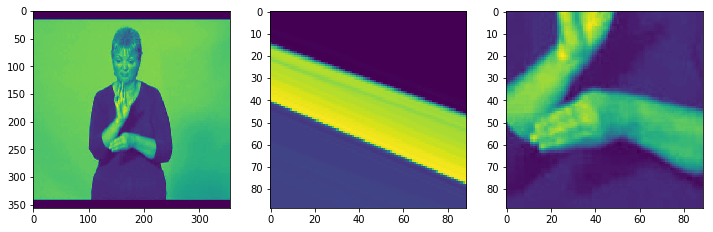

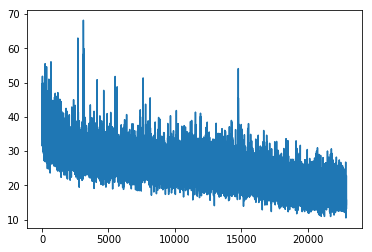

15.631
epoch 21 start
Theta[0] :  [ 0.22456759 -0.02314878 -0.2443096   0.01707748  0.29363352  0.40600801]


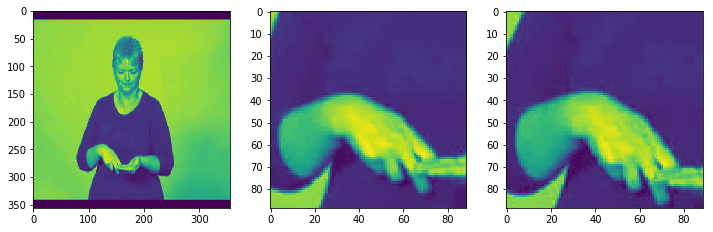

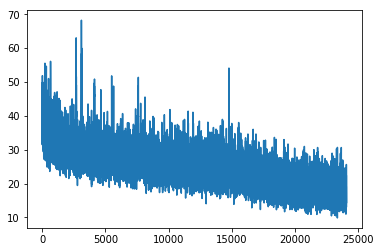

22.2211
epoch 22 start
Theta[0] :  [ 0.21632373  0.05148776  0.20615253 -0.02676114  0.01973623  0.86007088]


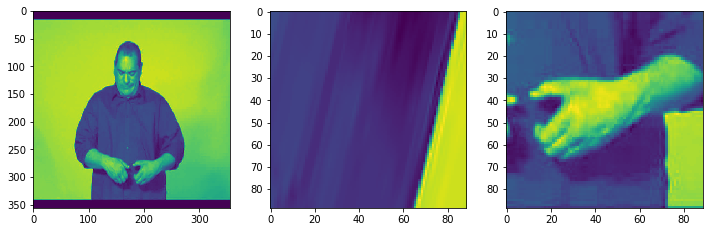

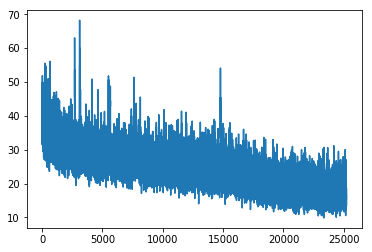

16.6476
epoch 23 start
Theta[0] :  [-0.04650122 -0.03820559  0.18595628  0.09804985  0.13784492  0.38198376]


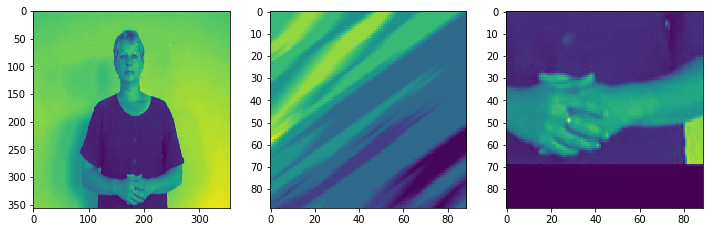

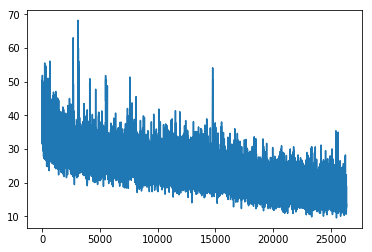

13.1305
epoch 24 start
Theta[0] :  [ 0.28818941  0.3348147  -0.54079533 -0.07841475  0.58665639  0.11759607]


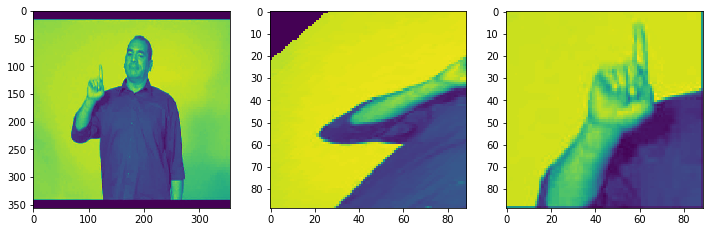

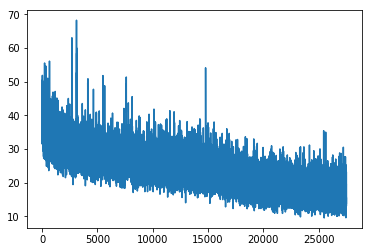

15.3929
epoch 25 start
Theta[0] :  [ 0.2850005  -0.24140298  0.31429246  0.08257533 -0.2358849   0.87595534]


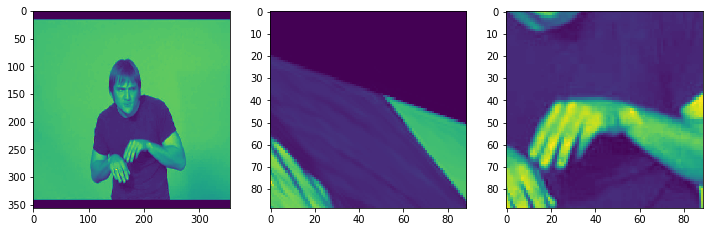

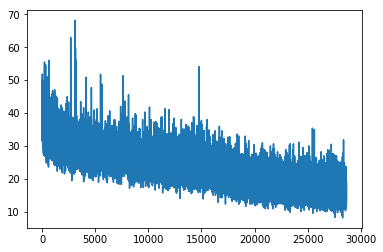

14.5366
epoch 26 start
Theta[0] :  [ 0.36254579 -0.24210602 -0.0133989  -0.00167558  0.42317164  0.14404377]


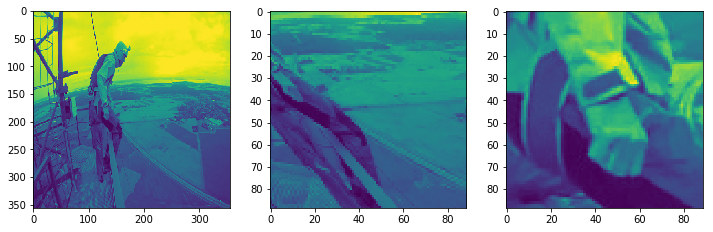

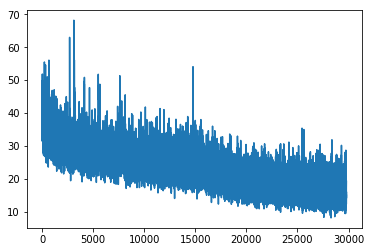

15.0021
epoch 27 start
Theta[0] :  [ 0.69285327 -0.4795647  -0.35239074 -0.14059758  1.0318526   0.51688957]


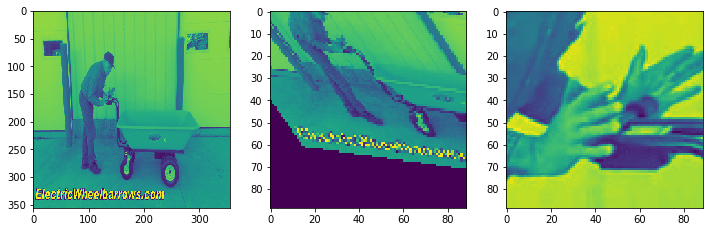

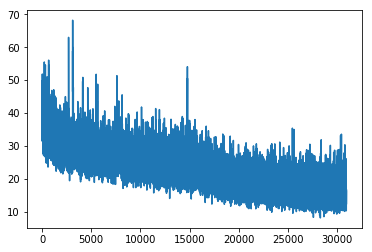

16.2762
epoch 28 start
Theta[0] :  [ 0.2036261   0.13521698 -0.31283718  0.07661521  0.18221056  0.41263607]


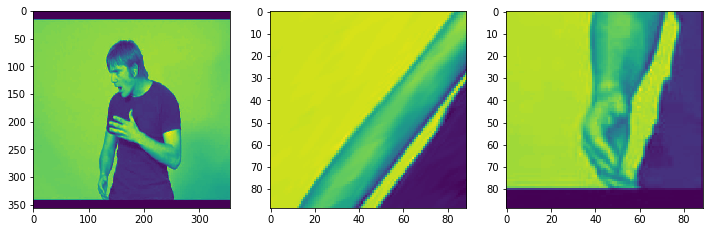

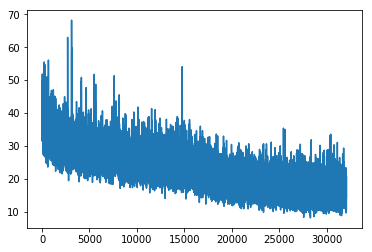

14.1568
epoch 29 start
Theta[0] :  [ 0.27571303 -0.01318331 -0.19058634  0.00618964  0.32030421  0.62826687]


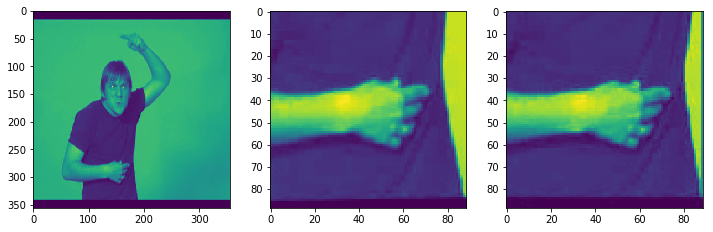

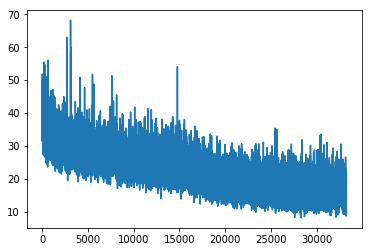

21.1882
epoch 30 start
Theta[0] :  [-0.37402666  0.10807175  0.01189416 -0.03539456 -0.06871444  0.37698773]


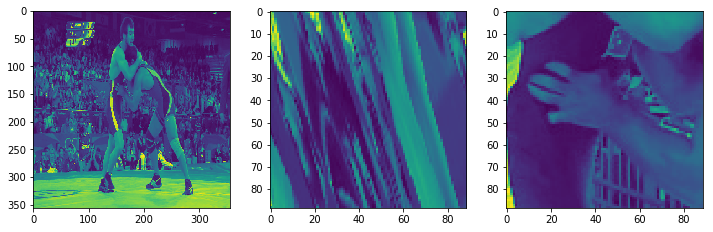

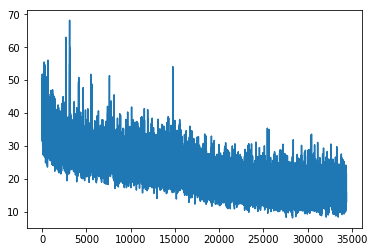

15.8
epoch 31 start
Theta[0] :  [ 0.16614938 -0.31627429  0.52082407 -0.14235035 -0.13560677  0.84777206]


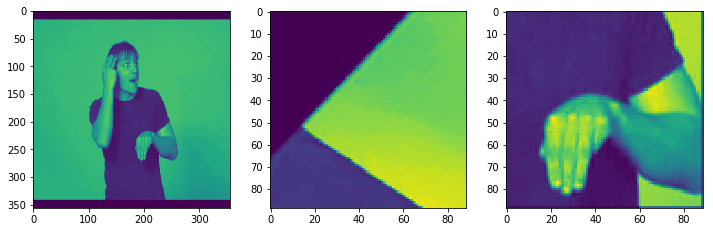

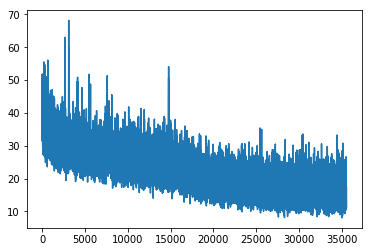

17.3558
epoch 32 start
Theta[0] :  [ 0.13594961  0.01940208  0.23591113 -0.0397728   0.14295703  0.3746278 ]


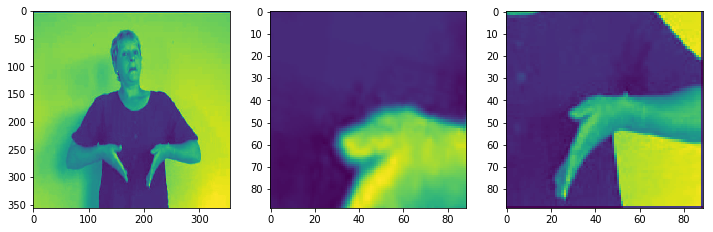

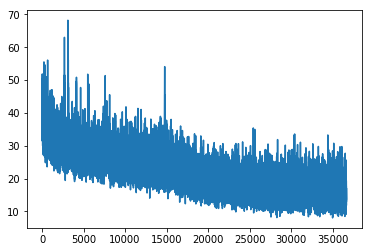

13.7705
epoch 33 start
Theta[0] :  [ 0.15380144  0.0230895  -0.20540553 -0.0017059   0.2120477   0.59259218]


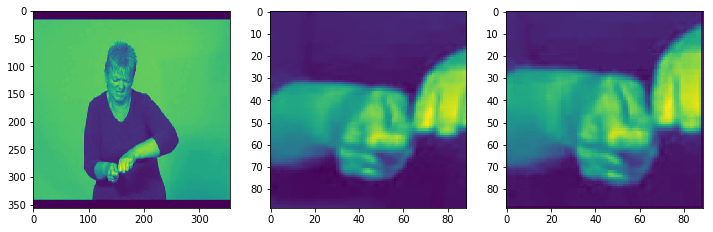

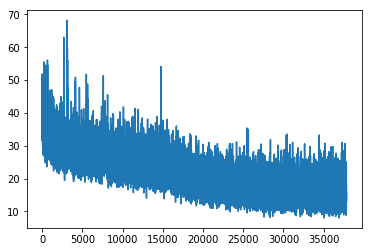

17.9919
epoch 34 start
Theta[0] :  [ 0.09295088  0.06510147  0.05430179 -0.07359825 -0.01324916  0.34397364]


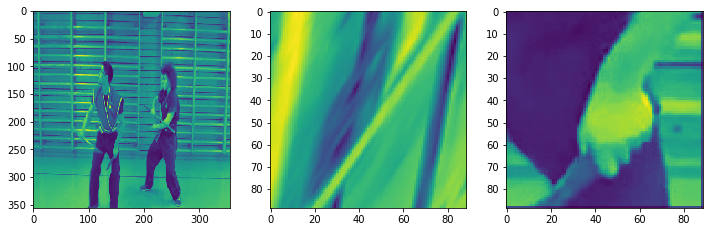

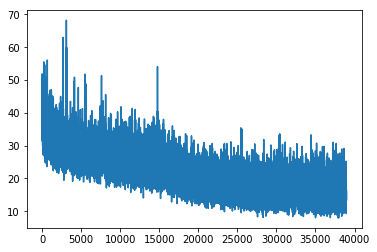

13.3937
epoch 35 start
Theta[0] :  [ 0.17511338 -0.06110617 -0.03029153  0.01143995  0.32505035  0.25201616]


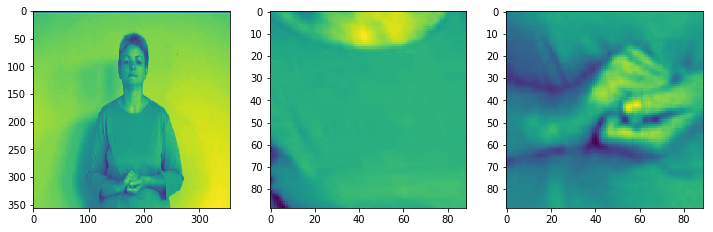

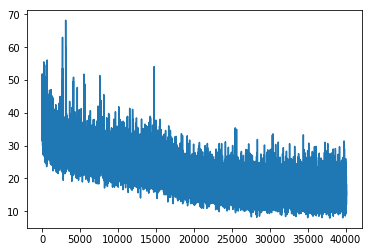

14.7534
epoch 36 start
Theta[0] :  [ 0.20147532 -0.02005527  0.11810271 -0.0207538   0.33458972  0.44804221]


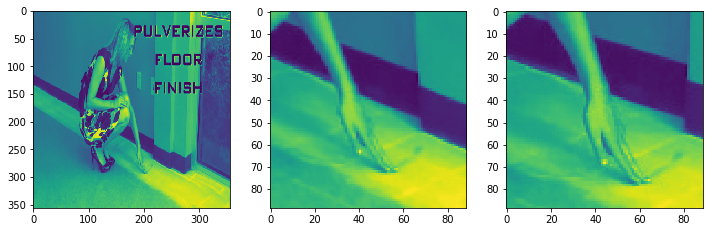

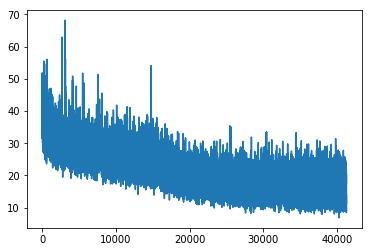

13.7594
epoch 37 start
Theta[0] :  [ 0.6672343   0.13049164 -0.70911908 -0.03564582  0.82198501  1.06153524]


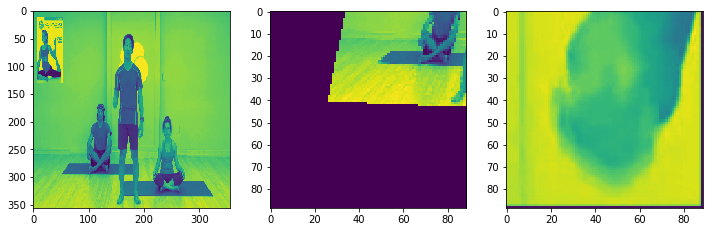

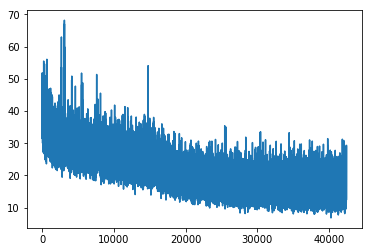

29.2618
epoch 38 start
Theta[0] :  [ 0.17683256  0.0862362  -0.05301741 -0.07992061  0.25281477  0.1792184 ]


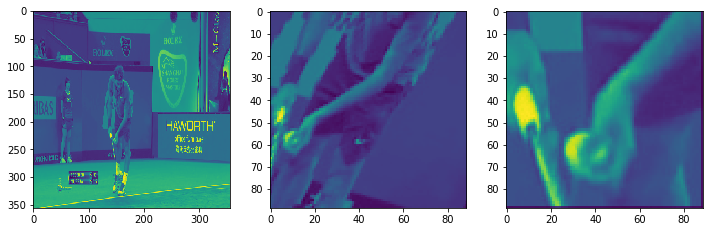

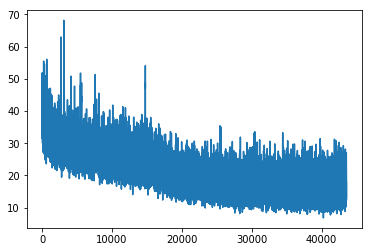

17.8743
epoch 39 start
Theta[0] :  [ 0.03909993  0.18964303  0.27919191 -0.04872419  0.17284596  0.30639654]


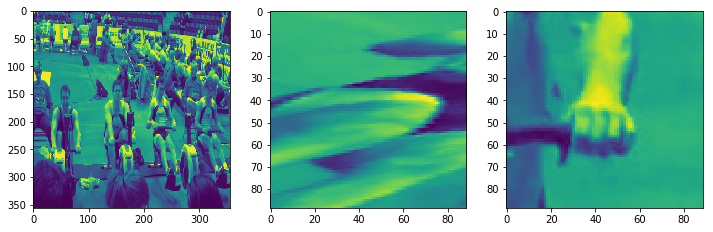

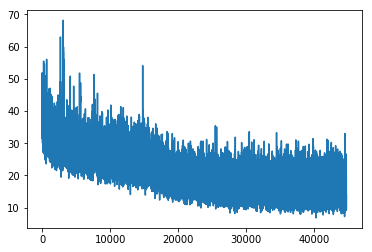

13.8572
epoch 40 start
Theta[0] :  [ 0.27875727 -0.04116657  0.20110396 -0.08026116  0.19807136  0.67735213]


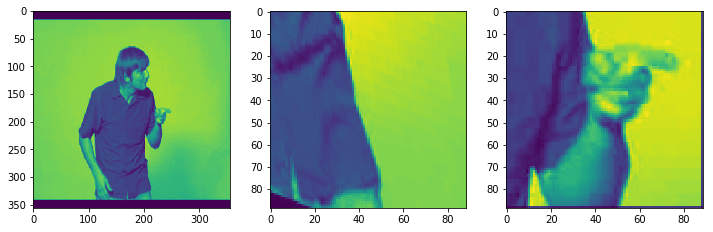

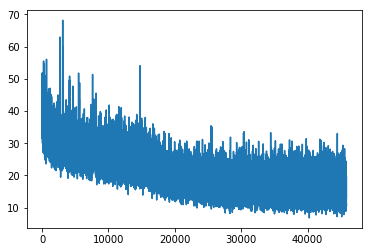

10.8931
epoch 41 start
Theta[0] :  [ 0.705091   -0.03846199 -0.02600364 -0.04132748  0.20749778  0.11478482]


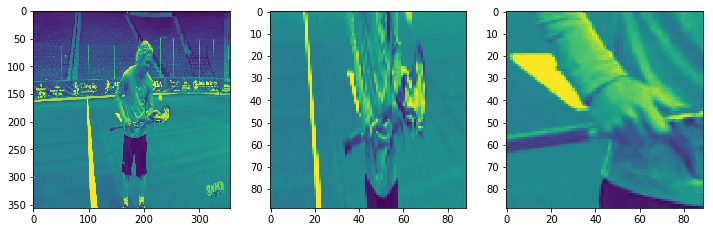

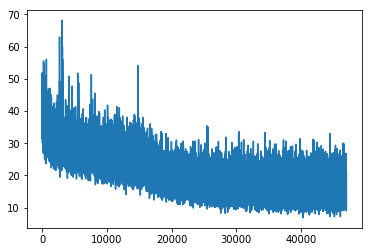

20.6795
epoch 42 start
Theta[0] :  [ 0.13960552 -0.06910586 -0.03974411  0.0140805   0.32472599  0.2727893 ]


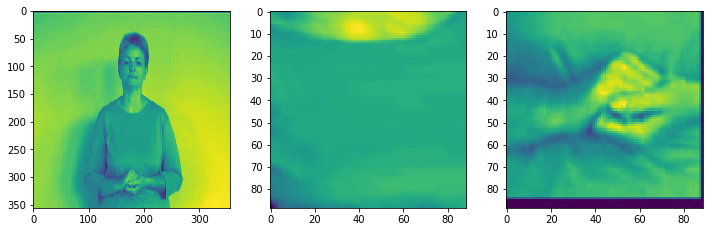

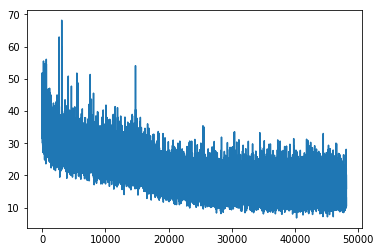

15.9186
epoch 43 start
Theta[0] :  [ 0.2858513   0.01932888 -0.08232671  0.00209722  0.36145419  0.39754316]


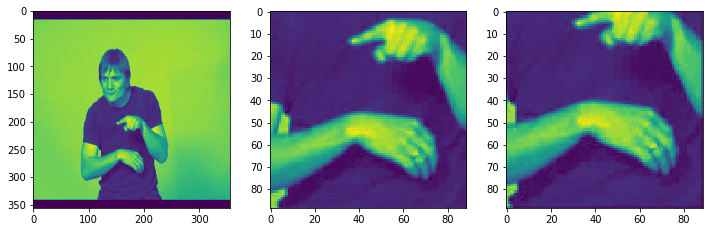

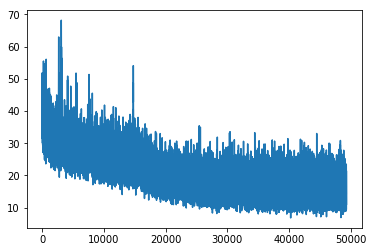

9.59075
epoch 44 start
Theta[0] :  [ 0.26834184  0.03760691 -0.2190648  -0.01461697  0.4204241   0.6646139 ]


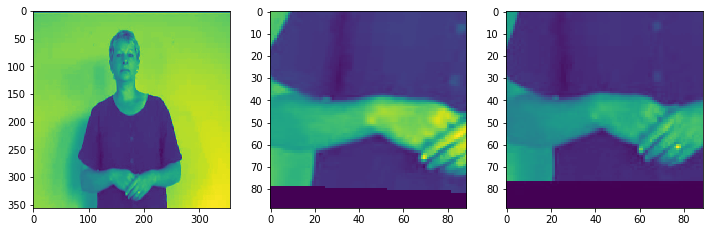

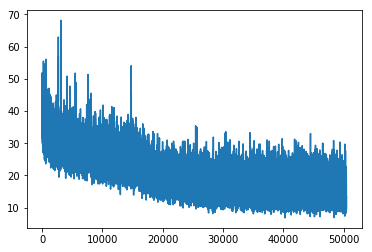

13.3279
epoch 45 start
Theta[0] :  [  7.08693862e-02   1.44694954e-01   1.25987962e-01   7.57980393e-04
   1.63505077e-02   8.01460862e-01]


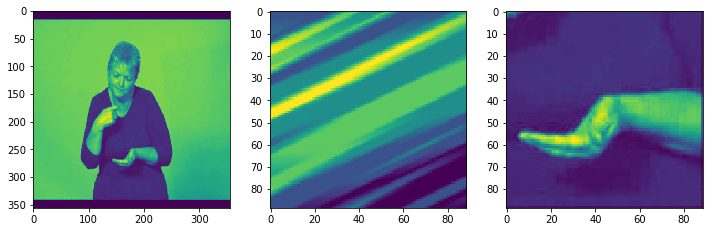

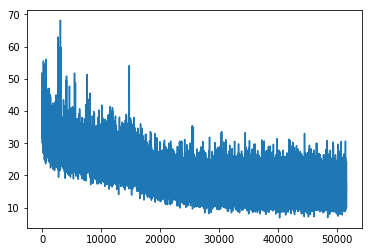

10.1388
epoch 46 start
Theta[0] :  [ 0.67661625 -0.05025957 -0.11555538  0.10370671  0.42798483  0.38679576]


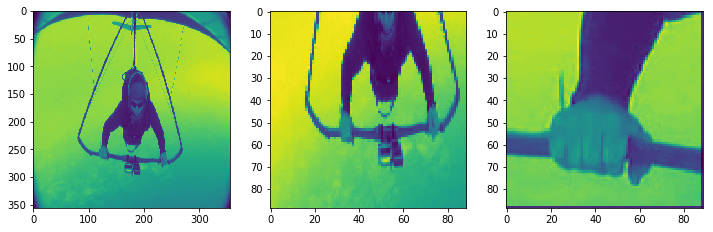

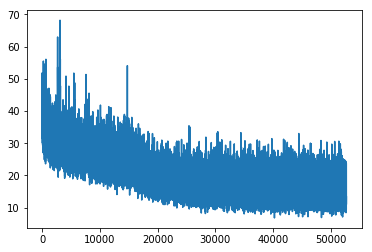

13.286
epoch 47 start
Theta[0] :  [ 0.7066015  -0.24209428  0.14185396  0.02301555  0.16790187  0.45411107]


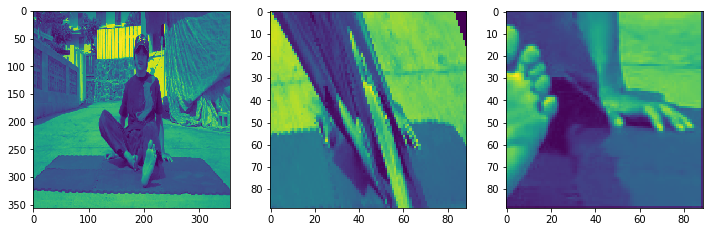

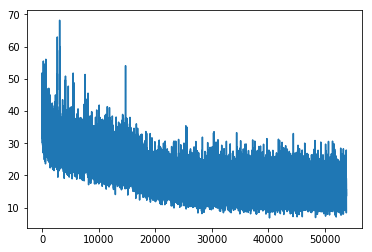

15.5429
epoch 48 start
Theta[0] :  [ 0.21662408 -0.00757376 -0.20232341 -0.00324473  0.27292943  0.15520895]


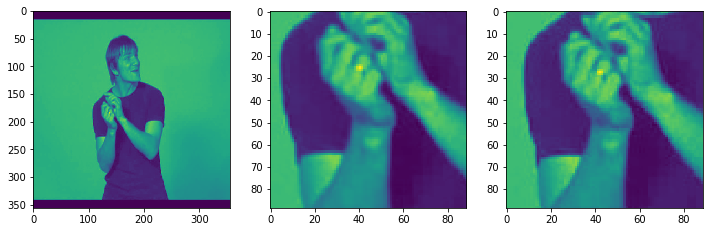

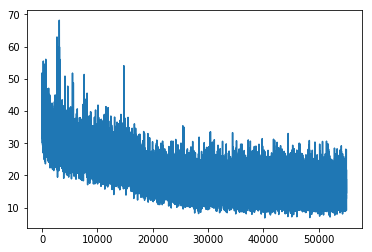

12.9656
epoch 49 start
Theta[0] :  [ 0.59781861  0.15071131  0.04032522  0.18693364  0.38844037  0.05505497]


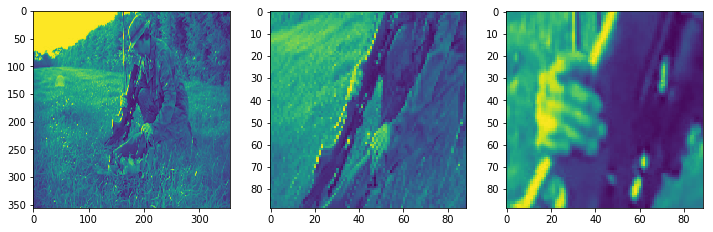

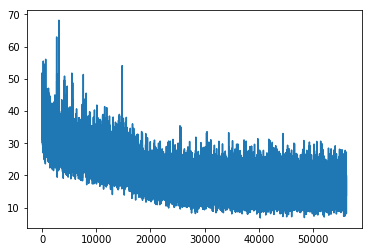

13.848
epoch 50 start
Theta[0] :  [ 0.38258117  0.08308375 -0.17025225  0.03311738  0.51260567  0.27121696]


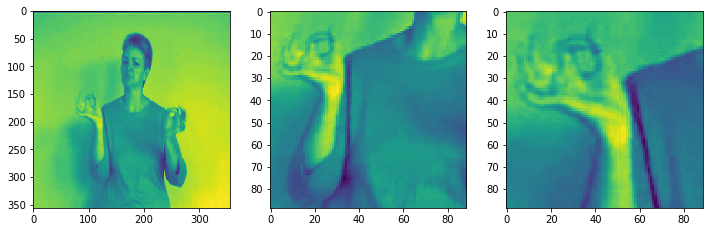

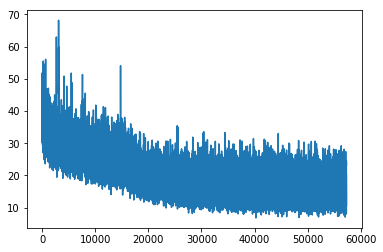

23.2528
epoch 51 start
Theta[0] :  [-0.01957828  0.46805853 -0.7616055   0.00947799  0.59889281  0.19334035]


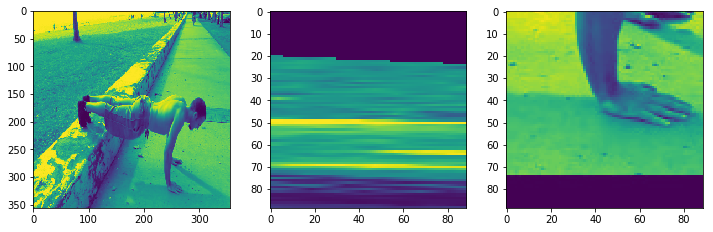

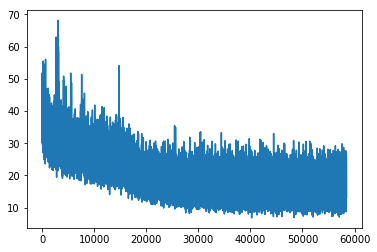

26.1655
epoch 52 start
Theta[0] :  [ 0.24852866 -0.00719986 -0.32569832 -0.00908749  0.29337132  0.05245633]


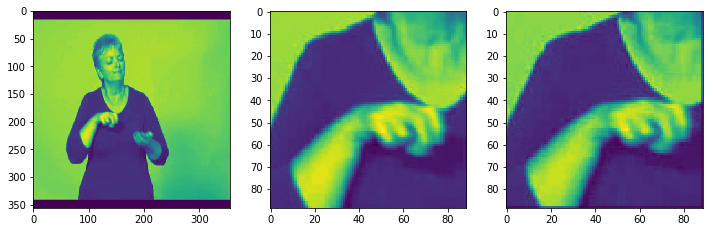

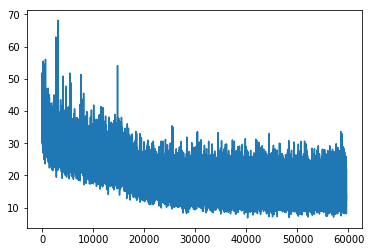

13.9852
epoch 53 start
Theta[0] :  [ 0.16297579  0.20633911 -0.06463668 -0.05203185 -0.07255983  0.32622904]


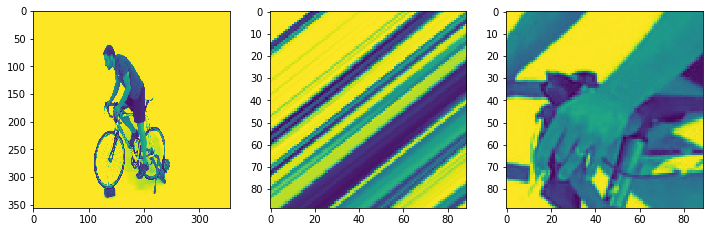

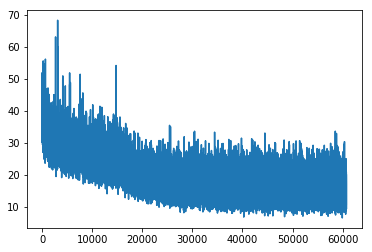

19.8923
epoch 54 start
Theta[0] :  [ 0.08376086  0.05460494  0.04042931 -0.20495664 -0.1747877   0.95976639]


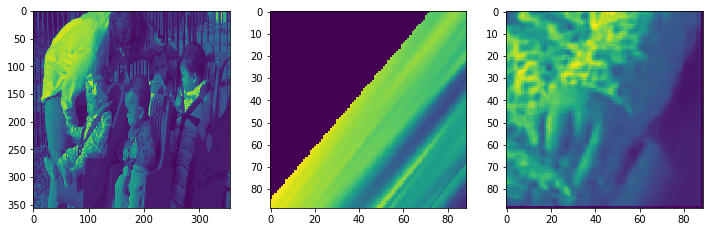

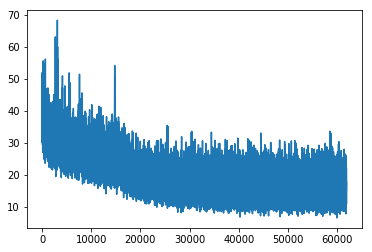

15.3535
epoch 55 start
Theta[0] :  [ 0.30963469 -0.0098038  -0.2280803   0.00343849  0.38422596  0.0817254 ]


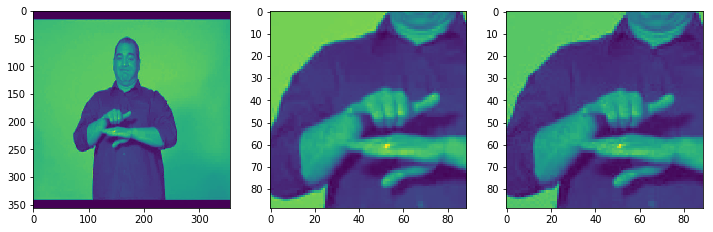

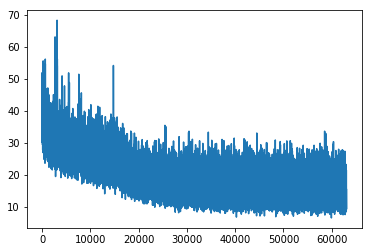

9.2841
epoch 56 start
Theta[0] :  [ 0.17083657  0.0344945   0.0199892   0.01045333  0.05956411  0.85694051]


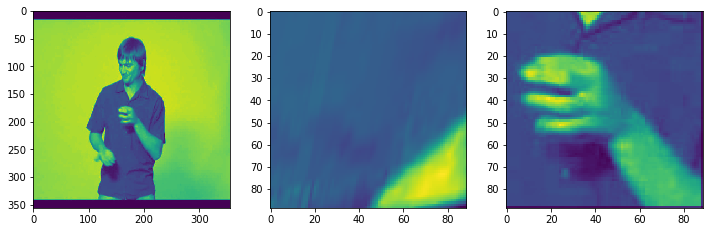

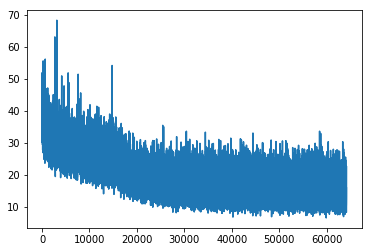

15.8729
epoch 57 start
Theta[0] :  [ 0.18019027 -0.17936352 -0.62088674 -0.06486469 -0.09433424  0.57809645]


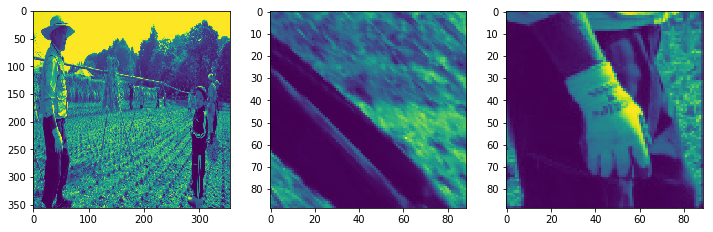

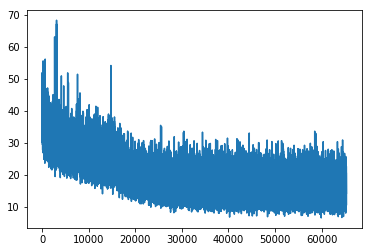

14.1928
epoch 58 start
Theta[0] :  [ 0.5314545   0.11409539  0.05243868 -0.08146781  0.84431982  0.37715748]


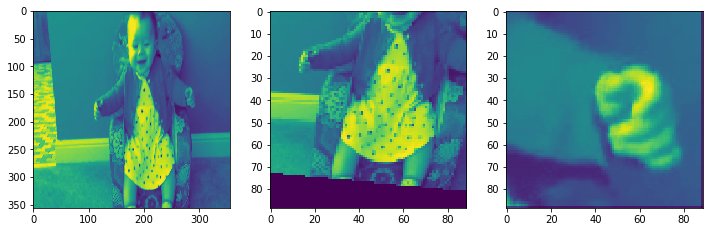

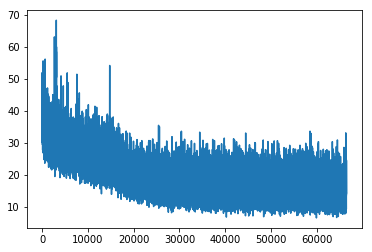

13.7923
epoch 59 start
Theta[0] :  [ 0.22843772  0.00493154 -0.34366122  0.01142189  0.27881253  0.43164316]


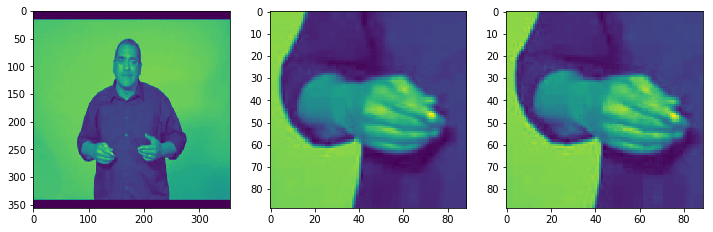

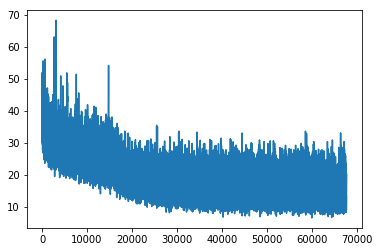

13.3385
epoch 60 start
Theta[0] :  [ 0.09573501  0.27089274 -0.36098287  0.17608602  0.00059998  0.20586765]


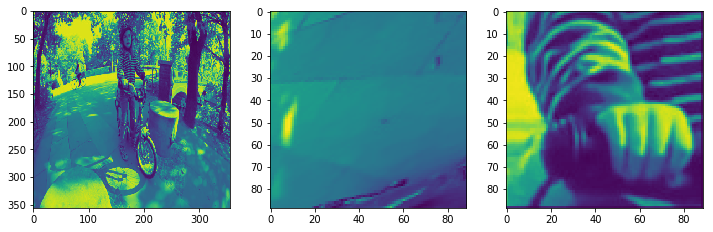

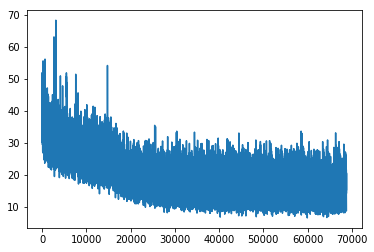

20.4372
epoch 61 start
Theta[0] :  [ 0.02107668  0.00603753  0.09361867  0.01136029  0.01292419  0.3498053 ]


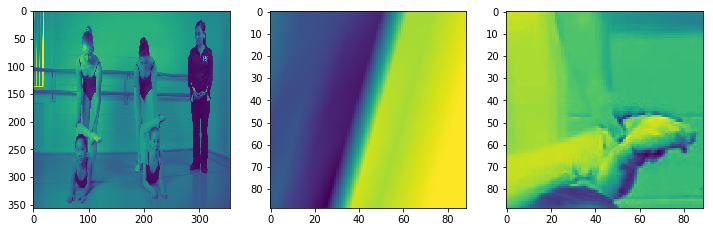

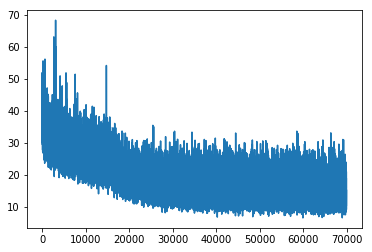

20.7369
epoch 62 start
Theta[0] :  [ 0.6409294  -0.03658379 -0.06089264  0.05202939  0.47900236  0.18780886]


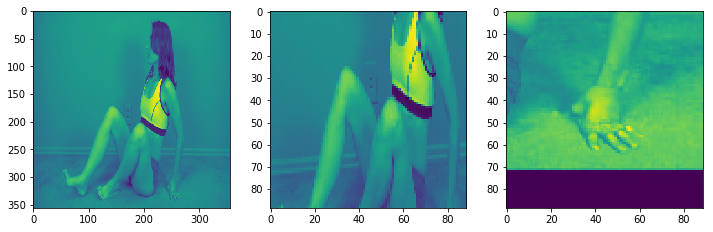

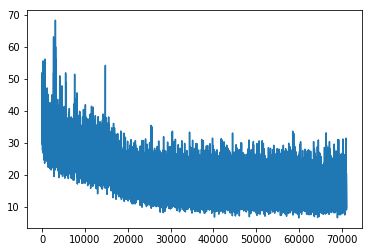

9.17021
epoch 63 start
Theta[0] :  [-0.0154146  -0.02005058  0.21497945  0.20568445  0.0561471   0.46407965]


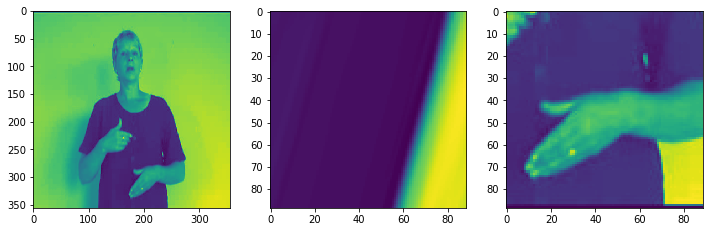

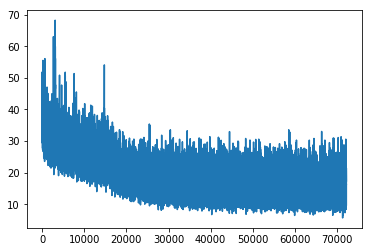

17.4078
epoch 64 start
Theta[0] :  [ 0.27243149 -0.08738171  0.07222085 -0.0820787   0.30394828  0.64107144]


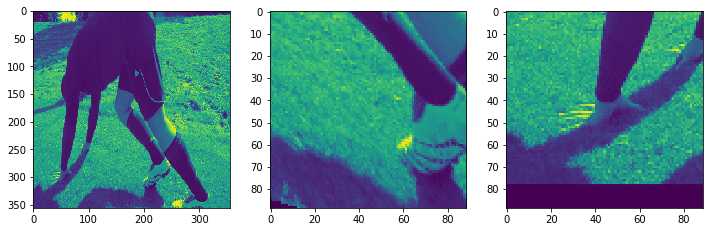

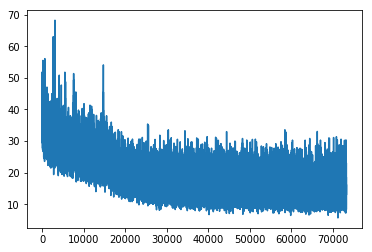

18.3869
epoch 65 start
Theta[0] :  [ 0.2526297   0.0024147  -0.41564187  0.00041649  0.31848657  0.0219504 ]


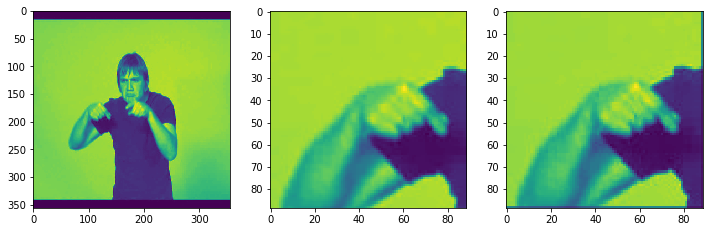

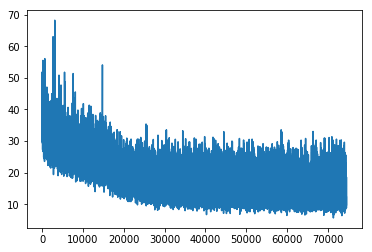

12.2966
epoch 66 start
Theta[0] :  [ 0.19974732  0.02727601  0.08616402  0.24265376  0.30723482  0.22669233]


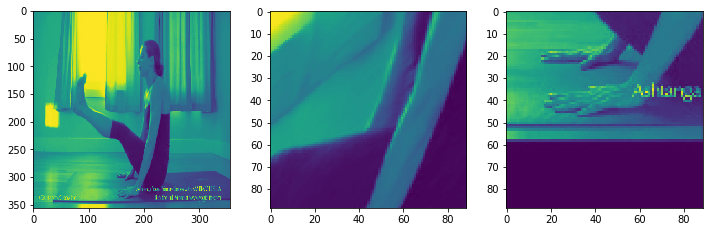

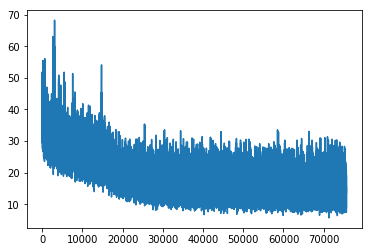

13.661
epoch 67 start
Theta[0] :  [ 0.07719445 -0.10841051  0.05933136  0.08365087 -0.06582767  0.15273172]


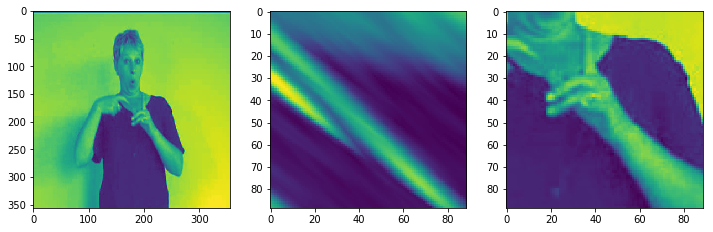

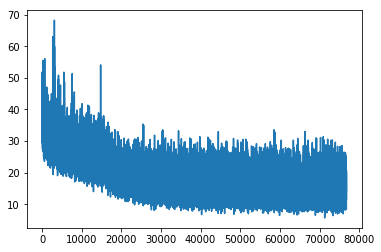

14.1979
epoch 68 start
Theta[0] :  [ 0.12606442  0.10429651  0.00381802  0.10666791  0.02875614  0.78554881]


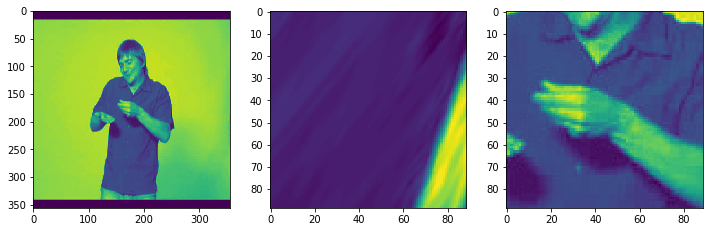

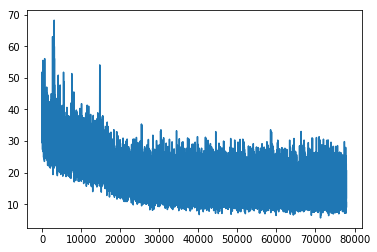

10.5779
epoch 69 start
Theta[0] :  [ 0.08572489  0.00246102 -0.07431071 -0.45991141  0.43478686  0.47189245]


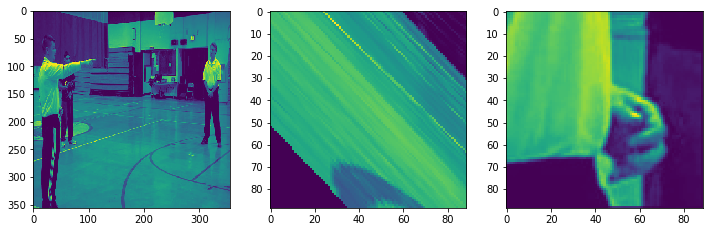

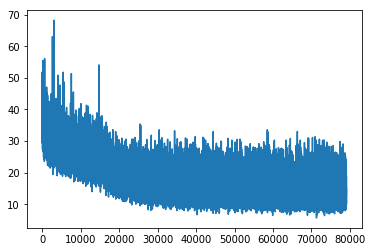

13.186
epoch 70 start
Theta[0] :  [ 0.24453288  0.00443036 -0.29544851 -0.00070305  0.28613555  0.06269678]


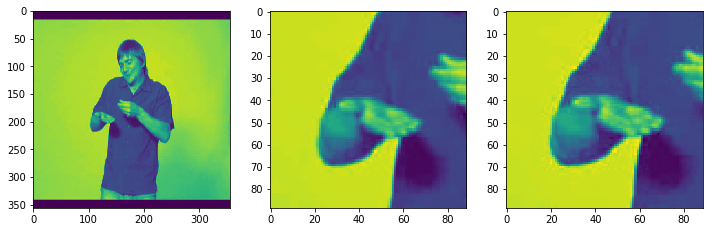

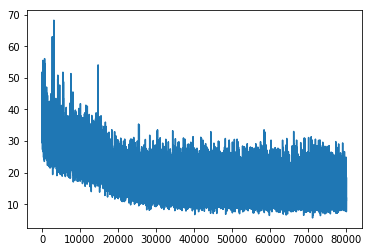

11.9531
epoch 71 start
Theta[0] :  [ 0.73164147  0.15247574 -0.24722764 -0.11192427  0.65071297 -0.1961371 ]


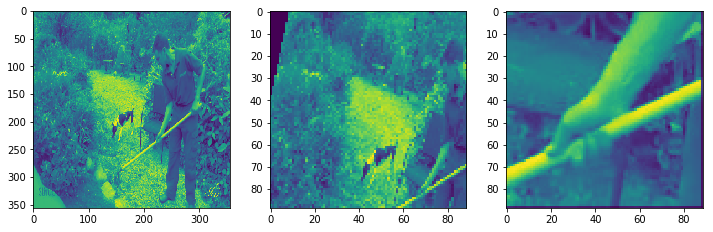

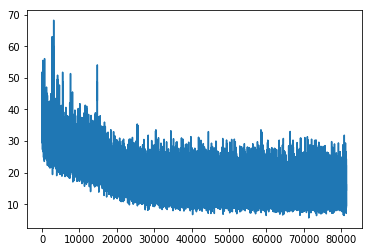

14.5448
epoch 72 start
Theta[0] :  [ 0.21783155  0.04546174 -0.70473057  0.00214578  0.2840957   0.46557108]


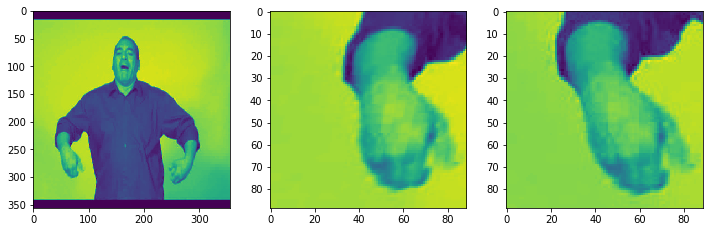

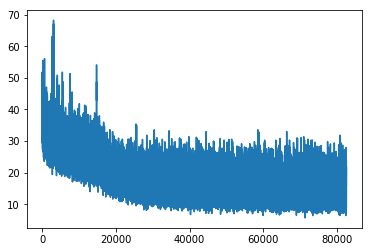

15.7175
epoch 73 start
Theta[0] :  [ 0.14780724  0.02607419 -0.20410874  0.13960795  0.29441696  0.27606666]


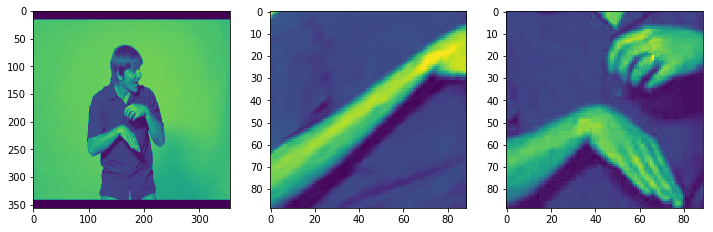

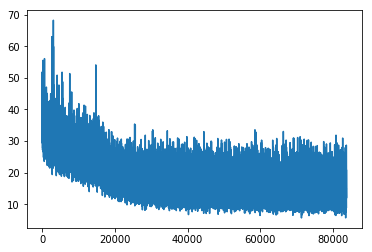

12.063
epoch 74 start
Theta[0] :  [ 0.00291312  0.07177471 -0.21168368  0.01620674  0.08644891 -0.28488922]


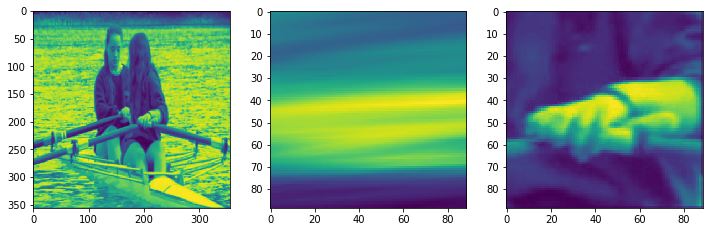

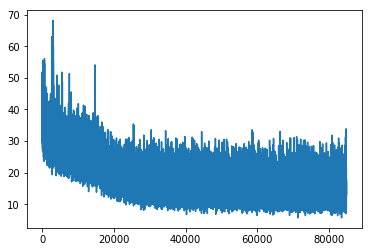

13.5326
epoch 75 start
Theta[0] :  [-0.01188791  0.23090526 -0.81230801 -0.18137388  0.09403026 -0.44689655]


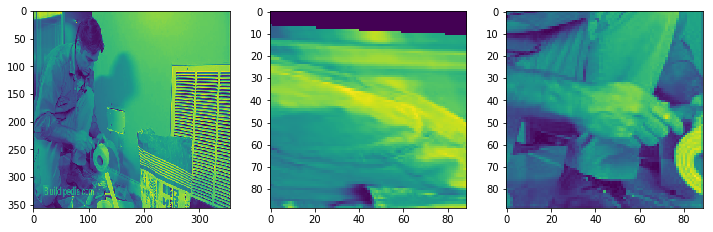

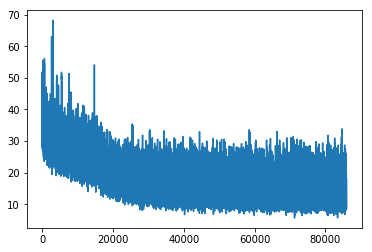

11.7061
epoch 76 start
Theta[0] :  [ 0.17090958  0.08079453  0.18060711 -0.01375933  0.01179355  0.86098081]


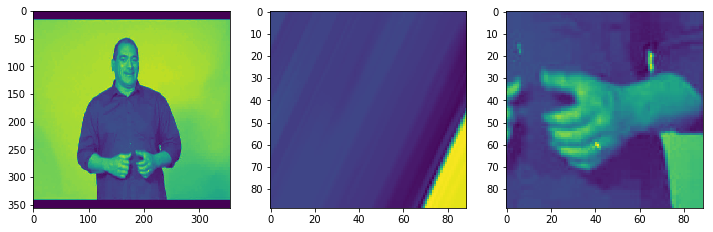

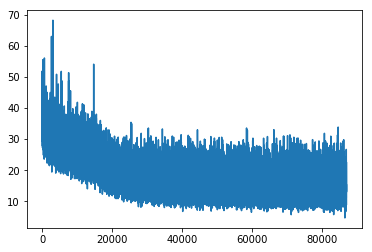

13.1171
epoch 77 start
Theta[0] :  [ 0.02752787  0.0783155  -0.05570764 -0.15723236 -0.17820597  0.58879387]


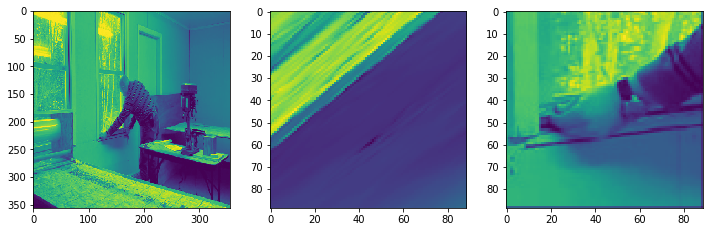

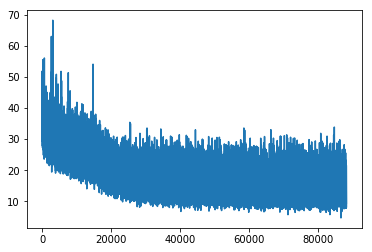

21.3608
epoch 78 start
Theta[0] :  [-0.00502348  0.05236657 -0.30740577  0.00957445  0.0617488   0.18055046]


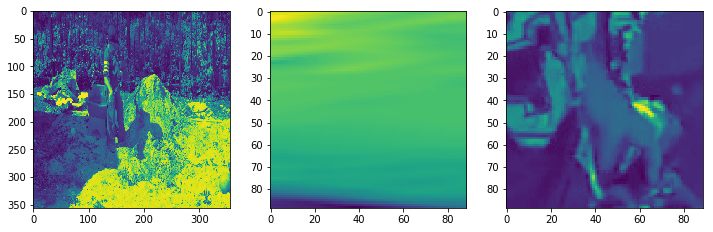

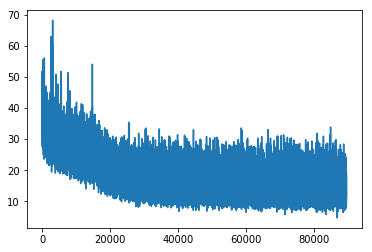

11.6139
epoch 79 start
Theta[0] :  [ 0.02810937 -0.03702971  0.02899094  0.02801616  0.26883745  0.3210994 ]


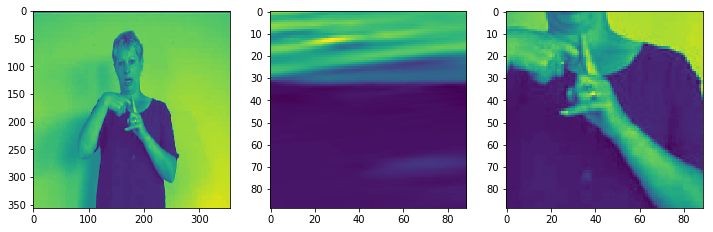

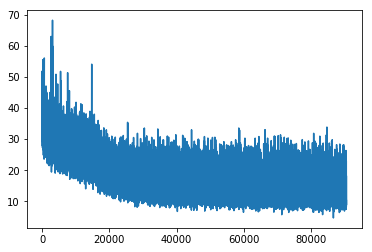

10.2715
epoch 80 start
Theta[0] :  [ 0.36807758  0.07270435 -0.48019734 -0.09911865  0.5228253   0.1220487 ]


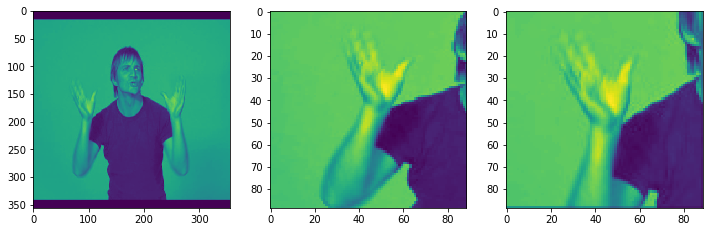

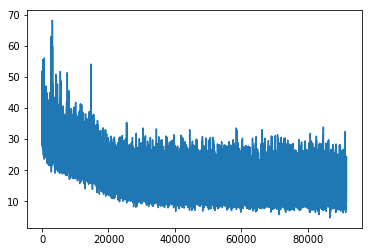

12.1931
epoch 81 start
Theta[0] :  [ 0.02792388  0.4126853  -0.19951867  0.1044437  -0.03136098  0.33134753]


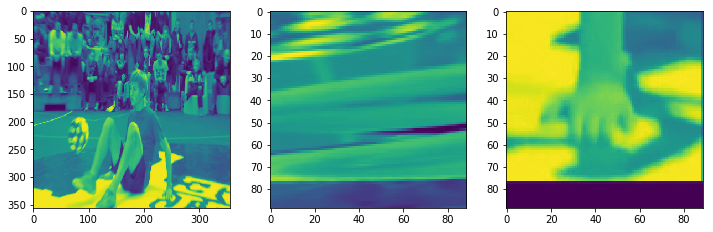

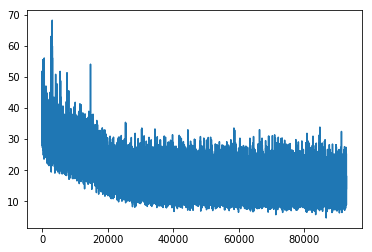

14.106
epoch 82 start
Theta[0] :  [ 0.30192912 -0.12965949  0.3901926  -0.09584537  0.20635045  0.67278725]


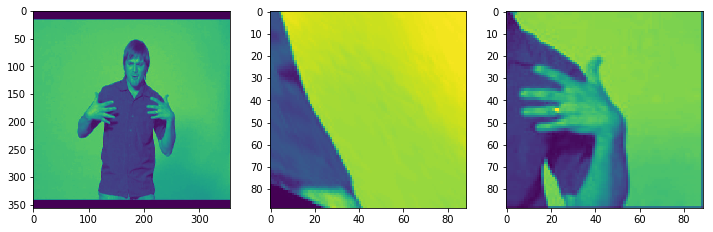

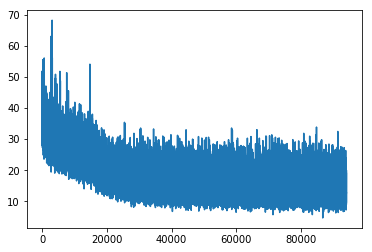

12.6842
epoch 83 start
Theta[0] :  [ 0.31300849 -0.02195584  0.23068336  0.01751024  0.39354086  0.5928914 ]


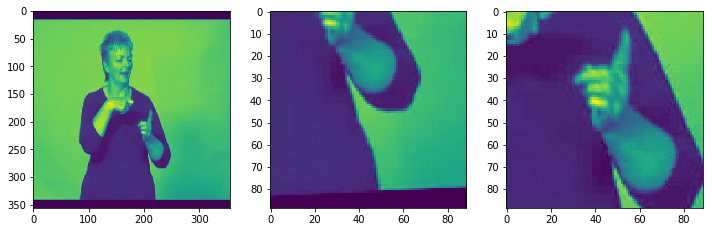

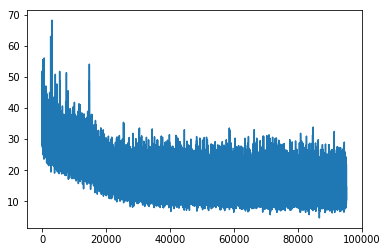

21.66
epoch 84 start
Theta[0] :  [-0.13962036 -0.11325359  0.74469149 -0.28369692 -0.15824342  0.96280575]


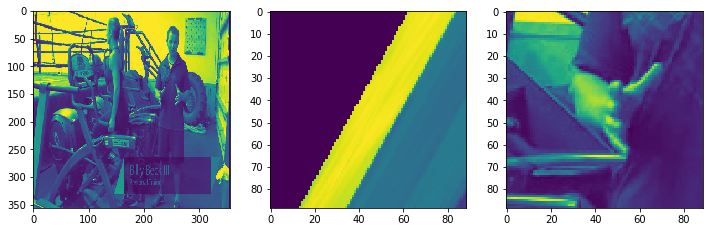

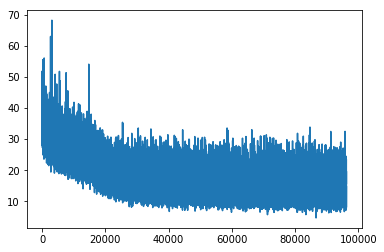

15.8019
epoch 85 start
Theta[0] :  [ 0.15218037  0.00621519 -0.29695019  0.07182322  0.29859203  0.69445693]


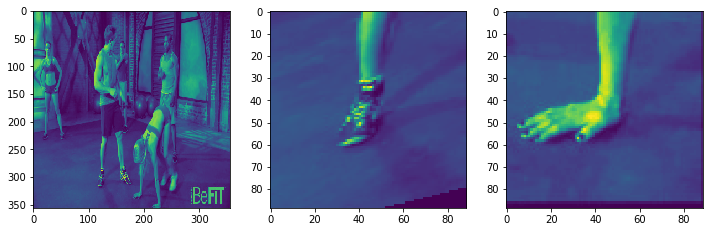

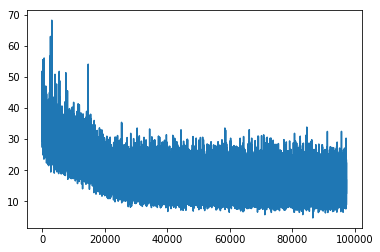

16.8376
epoch 86 start
Theta[0] :  [ 0.24817318 -0.09396386 -0.72978818 -0.33541638  0.49849489  0.06040764]


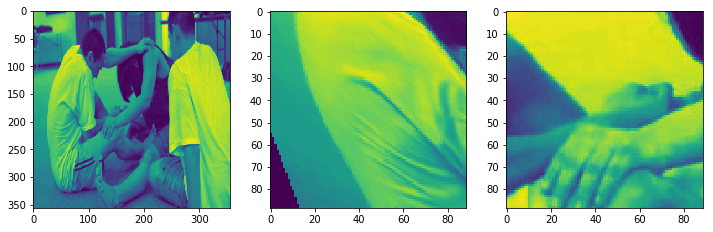

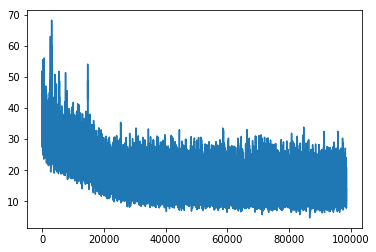

14.0463
epoch 87 start
Theta[0] :  [ 0.28399152 -0.21164556  0.31740019  0.01597765  0.15830612  0.74269503]


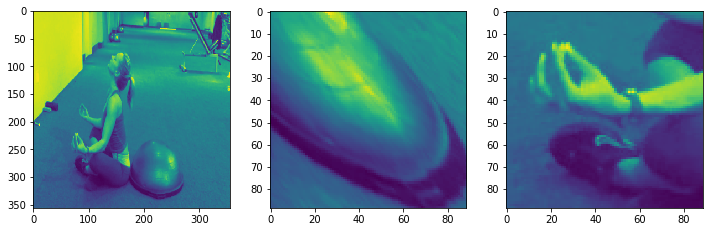

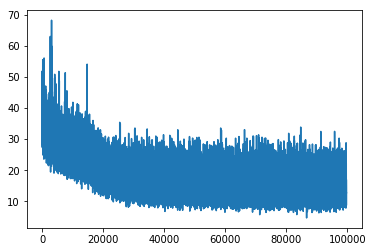

12.7877
epoch 88 start
Theta[0] :  [ 0.08604431  0.07362638  0.0063056   0.06835079  0.07043803  0.70880651]


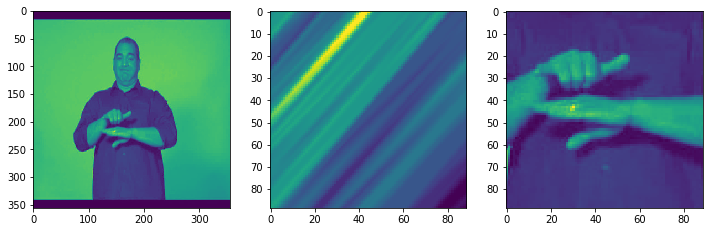

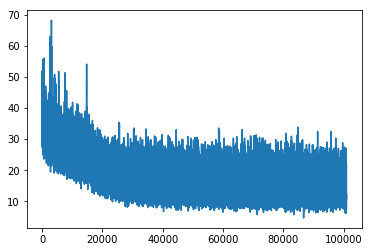

12.3427
epoch 89 start
Theta[0] :  [ 0.1523664   0.10531116  0.19685321 -0.19659041  0.07756829  0.36492032]


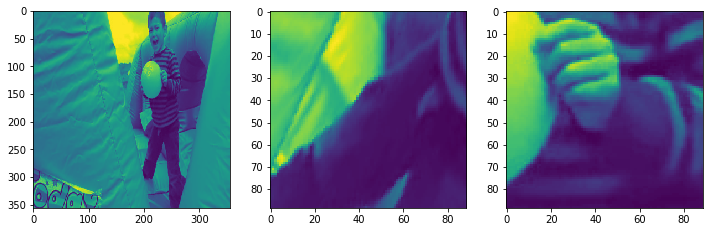

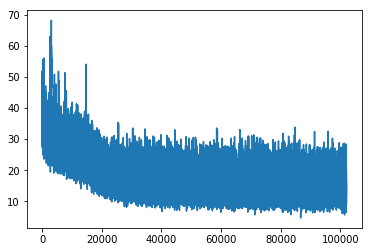

12.4009
epoch 90 start
Theta[0] :  [ 0.10936385 -0.00757453  0.0986922  -0.29488486  0.35159314  0.22621998]


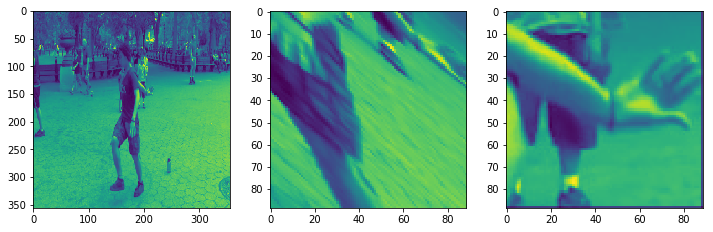

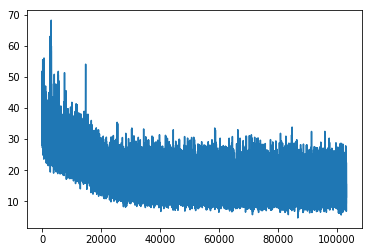

11.4027
epoch 91 start
Theta[0] :  [ 0.23237598 -0.0014229  -0.28356123  0.00292277  0.29426771  0.25289842]


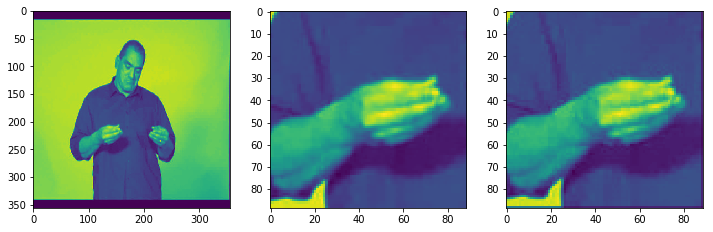

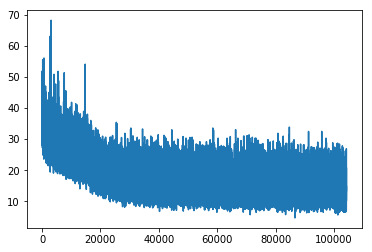

13.4111
epoch 92 start
Theta[0] :  [ 0.26071167 -0.18622658  0.40439978  0.20374258 -0.27860069  0.871122  ]


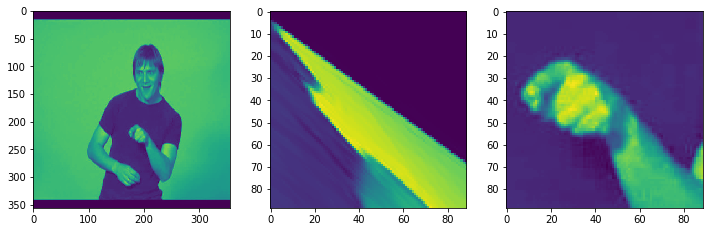

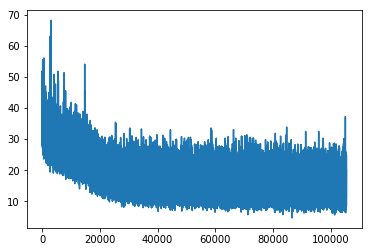

20.1088
epoch 93 start
Theta[0] :  [ 0.51688671  0.11496168 -0.34624794  0.00209134  0.52973419  0.53249049]


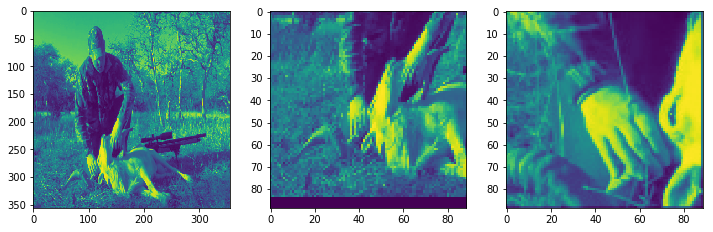

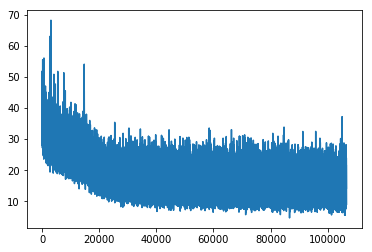

14.241
epoch 94 start
Theta[0] :  [ 0.01121253 -0.02710712  0.20588446  0.02636619  0.00077033  0.46982145]


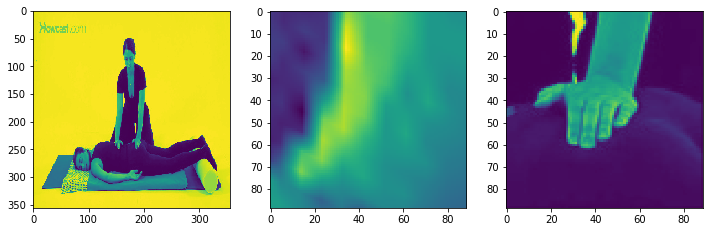

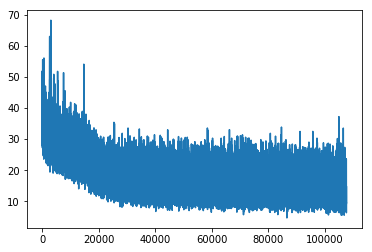

9.39722
epoch 95 start
Theta[0] :  [ 0.1249696   0.0055483   0.01553857  0.00798881  0.21236455  0.50085032]


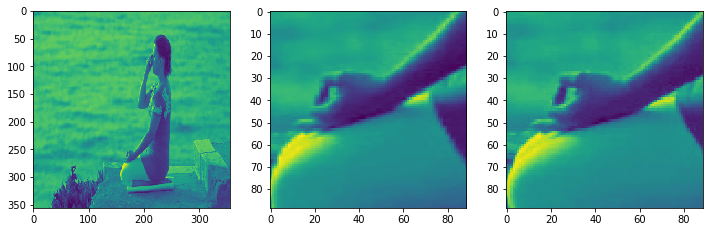

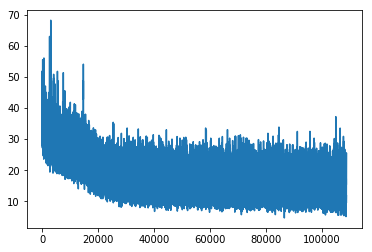

11.8149
epoch 96 start
Theta[0] :  [ 0.32160211  0.02064969  0.24319588 -0.03558942  0.39291459  0.57203561]


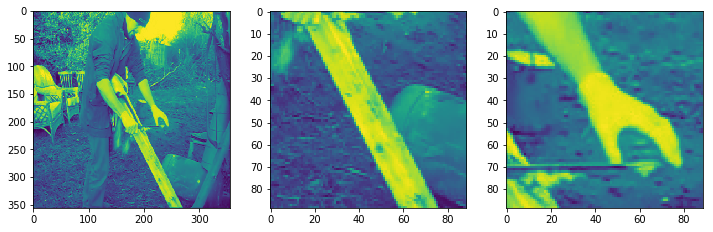

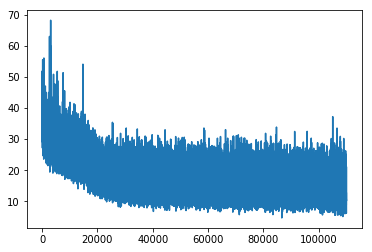

12.6016
epoch 97 start


In [ ]:
with tf.Session() as sess:
    obj = STN(sess = sess, epochs=200, batch_size=16)
    #img, confidencemap, PAFs = obj.train()
    obj.train()

In [28]:
def load_data(rot = False, trans = False):
    all_label_img_list = os.listdir("./dataset/test/Cropped_Resized_Image/")
    all_input_img_list = os.listdir("./dataset/test/Resized_Image/")

    batch_input_img_list, batch_label_img_list = make_batch(all_input_img_list, all_label_img_list, 16)

    condition_vector = []
    for i in range(len(batch_input_img_list)):
        if(batch_input_img_list[i][-5] == 'l'):
            tmp = np.ones((356, 356))
            tmp = np.expand_dims(tmp, axis=2)
            condition_vector.append(tmp)
        else:
            tmp = np.zeros((356, 356))
            tmp = np.expand_dims(tmp, axis=2)
            condition_vector.append(tmp)

    batch_input_img = []        
    for i in range(len(batch_input_img_list)):
        img = cv2.imread("./dataset/test/Resized_Image/" + batch_input_img_list[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        batch_input_img.append(img)

    batch_label_img = []
    for i in range(len(batch_label_img_list)):
        img = cv2.imread("./dataset/test/Cropped_Resized_Image/" + batch_label_img_list[i])
        #img = cv2.resize(img, (356, 356))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        batch_label_img.append(img)

    for i in range(len(batch_input_img)):
        batch_input_img[i] = cv2.normalize(batch_input_img[i], None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
        batch_label_img[i] = cv2.normalize(batch_label_img[i], None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)

    return batch_input_img, batch_label_img, condition_vector

In [43]:
batch_input_img, batch_label_img, condition_vector = load_data()

In [44]:
index = 5

(16, 356, 356)


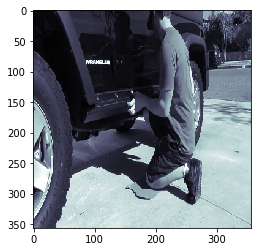

In [45]:
print(np.shape(batch_input_img))
plt.imshow(batch_input_img[index], cmap="bone")
plt.show()
#batch_input_img[index].min()

(16, 356, 356)


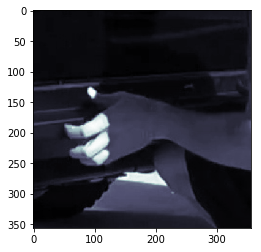

In [46]:
print(np.shape(batch_label_img))
plt.imshow(batch_label_img[index], cmap="bone")
plt.show()
#batch_label_img[index].max()

(356, 356, 1)


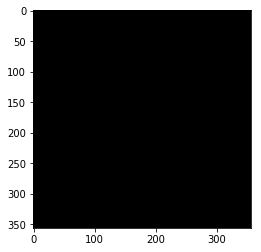

1.0

In [47]:
print(np.shape(condition_vector[index]))
a = np.squeeze(condition_vector[index])
plt.imshow(a, cmap="bone")
plt.show()
a.max()